# This notebook generates all plots for our dose-response of gene experession paper

In [3]:
# install the emcee MCMC library if needed
#!pip install emcee

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import emcee
import time
from multiprocessing import Pool
import multiprocessing
from scipy.stats import nbinom
import tqdm
import pandas as pd
import seaborn as sns
import matplotlib.colors as mcolors
import pickle

In [7]:
import os

os.environ["OMP_NUM_THREADS"] = "1"

In [8]:
# figure out the number of CPUs
n_cpu=multiprocessing.cpu_count()
print('number cpus=',n_cpu)

number cpus= 12


## MC sampling & data analysis functions

In [9]:
# Convert the MCMC library to a python script
!jupyter nbconvert --to script Lib_MCMC_v3.ipynb

[NbConvertApp] Converting notebook Lib_MCMC_v3.ipynb to script
[NbConvertApp] Writing 13612 bytes to Lib_MCMC_v3.py


In [10]:
from Lib_MCMC_v3 import DoReSeq, analyze_MCMC

### generate synthetic data

In [11]:
def mk_samples(gene_spec, dose_spec=[], time_spec=[]):
    '''
    This function generates synthetic data
    
    Input:
    gene_spec: a list of ground truth values for fitting parameters for each gene [tpm, phi, kd, ic50, (delta)]
                the parameter delta is optional, it is only used if time_spec is provided
    dose_spec: a list of doses
    time_spec: optional: a list of times
    
    '''
    if len(time_spec)!=0:
        gene_spec1=[[f'tpm:{g[0]}_phi:{g[1]}_kd:{g[2]}_ic50:{g[3]}_delta:{g[4]}_{i}',g[0],g[1],g[2],g[3],g[4]] for i,g in enumerate(gene_spec)]
    else:
        gene_spec1=[[f'tpm:{g[0]}_phi:{g[1]}_kd:{g[2]}_ic50:{g[3]}_{i}',g[0],g[1],g[2],g[3]] for i,g in enumerate(gene_spec)]
    
    # generate the meta data
    aso="aso0"
    if len(dose_spec)==0:
        dose_list = np.asarray([0]*90+[0.625]*2 + [1.25]*2 + [2.5]*2 + [5]*2 + [10]*4).reshape(-1)
    else:
        dose_list = np.copy(dose_spec)
    sample_id_list=np.arange(len(dose_list))
    scale_list = np.random.uniform(1e6, 1e7, dose_list.shape[0]).reshape(-1)

    if len(time_spec)!=0:
        time_list=np.copy(time_spec)
        use_time=True
    else:
        use_time=False
        
    # write the metadata to a data frame
    df_meta_select = pd.DataFrame()

    df_meta_select.loc[:, "sample_id"] = sample_id_list
    df_meta_select.loc[:, "dose"] = dose_list
    df_meta_select.loc[:, "aso"] = aso
    df_meta_select.loc[:, "scale"] = scale_list
    if use_time:
        df_meta_select.loc[:, "time"] = time_list

    # generate the raw counts data
    raw_sample=[]
    for g in gene_spec1:
        tpm_i,phi_i,kd_i,ic50_i=g[1:5]
        
        if use_time:
            delta_i=g[5]
            af=(1.-np.exp(-delta_i*time_list))
        else:
            af=1.

        mu = (scale_list * tpm_i / 1e6) * (1 - ((dose_list * ((1 - kd_i))) / (dose_list + ic50_i)) * af) 
        phi = phi_i

        raw_sample.append(np.random.negative_binomial(1/phi, 1/(1+mu*phi)))
    df_raw_select=pd.DataFrame(raw_sample,columns=sample_id_list,index=[g[0] for g in gene_spec1])
    df_raw_select.index.name='gene_id'
    df_raw_select.columns.name='sample_id'
    
    return gene_spec1, df_meta_select, df_raw_select

In [12]:
def make_dr_plot(ax, ground_truth, MAPestimate, gene, make_legend=True, make_xlabel=True, make_ylabel=True):
    # this function constructs dose-response plots
    # Step 1: MAP plot -- tpm vs. dose & NB induced fluctuations of TPM vs. dose
    
    # figure out MAP estimates of fit parameters
    tpm_i,phi_i,kd_i,ic50_i=MAPestimate
    print(f'MAP estimate: tpm={tpm_i}, phi={phi_i}, kd={kd_i}, ic50={ic50_i}')

    # simulate data for MAP estimated fit parameters to get distributions
    df_sim_data=pd.DataFrame()
    for dose, scale in zip(df_meta_select['dose'], df_meta_select['scale']):
        mu=(1E-6)*scale*tpm_i*(1 - (dose * (1 - kd_i)) / (dose + ic50_i))

        raw_counts=np.random.negative_binomial(1./phi_i, 1./(1.+ mu*phi_i),1000)

        df_sim_data1=pd.DataFrame()
        df_sim_data1.loc[:,'raw_counts']=raw_counts
        df_sim_data1.loc[:,'tpm']=(1E6)*raw_counts/scale
        df_sim_data1.loc[:,'dose']=dose
        df_sim_data1.loc[:,'scale']=scale
        df_sim_data1.loc[:,'label']='Bayesian histogram'

        df_sim_data=pd.concat((df_sim_data,df_sim_data1))

    # extract the distributions from the simulated data (as well as the MAP estimate for dose-response)
    sim_res=[]
    max_tpm=np.max(df_sim_data['tpm'])
    ds=np.sort(np.array(list(set(df_sim_data['dose']))))

    for d in ds:
        tpm_data=df_sim_data[df_sim_data['dose']==d]['tpm']

        MAPtpm=tpm_i*(1-d*(1-kd_i)/(d+ic50_i))                                            # MAP estimate of tpm as a function of dose 
        sim_res.append([np.quantile(tpm_data,0.05), MAPtpm,np.quantile(tpm_data,0.95)])   # 
    sim_res=np.array(sim_res)
    
    #plot the results
    #plt.errorbar(ds,sim_res[:,1],yerr=[sim_res[:,1]-sim_res[:,0],sim_res[:,2]-sim_res[:,1]],capsize=5, fmt='o-',color='purple',label='MAP estimate', fillstyle='none')
    ax.plot(ds,sim_res[:,1],'--',color='lime',label='MAP estimate')
    ax.fill_between(ds,sim_res[:,0],sim_res[:,2],color='lime',label='NB: 5% to 95%',alpha=0.1)

    # step 2: plot the ground truth  
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    print(f'ground truth: tpm={tpm_i}, phi={phi_i}, kd={kd_i}, ic50={ic50_i}')
    dose_sweep=np.linspace(0,10,50)
    mu=(tpm_i) * (1 - ((dose_sweep * ((1 - kd_i))) / (dose_sweep + ic50_i)) ) 
    ax.plot(dose_sweep,mu,label='Ground truth',color='cyan')

    # step 3: and the raw data that was fed to the fitting function
    dose_list=df_meta_select['dose']
    scale_list=df_meta_select['scale']
    ax.plot(dose_list,1e6*np.array(df_raw_select[df_raw_select.index==gene]).reshape(-1)/scale_list,\
             'o',color='blue',label='Synthetic data', markersize=6, fillstyle='none')
    ax.set_ylim(0,100)
    
    if make_xlabel:
        ax.set_xlabel('Dose [au]')
    if make_ylabel:
        ax.set_ylabel('TPM')

    if make_legend:
        handles, labels = ax.get_legend_handles_labels()
        order = [2,3,0,1]
        ax.legend([handles[idx] for idx in order],[labels[idx] for idx in order], frameon=False)


In [13]:
def mk_tpm_phi_scatter_plot(ax, ground_truth, res, gene, make_legend=True, xlim=False, ylim=False, make_xlabel=True, make_ylabel=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    
    MAPestimate=res[i]['analysis']['MAP estimate']
    sample=res[i]['MCMC_sample']
    
    ax.plot([-1], [-1], '.k',label='MC samples',alpha=1, markersize=4)
    ax.plot(sample[:, 0], sample[:, 1], ',k',alpha=0.1)
    
    tpm_i,phi_i,kd_i,ic50_i=MAPestimate
    ax.plot([tpm_i],[phi_i],'o',label='MAP estimate',color='lime', markersize=8)
    
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    ax.plot([tpm_i],[phi_i],'^',label='Ground truth',color='cyan', markersize=8)
    
    if make_xlabel:
        ax.set_xlabel('tpm')
    if make_ylabel:
        ax.set_ylabel('phi')
    
    if make_legend:
        ax.legend(frameon=False)
                
def mk_kd_ic50_scatter_plot(ax, ground_truth, res, gene, make_legend=True, make_xlabel=True, make_ylabel=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    
    MAPestimate=res[i]['analysis']['MAP estimate']
    sample=res[i]['MCMC_sample']
    
    ax.plot([-1], [-1], '.k',label='MC samples',alpha=1, markersize=4)
    ax.plot(sample[:, 2], sample[:, 3], ',k',alpha=0.1)
    
    tpm_i,phi_i,kd_i,ic50_i=MAPestimate
    ax.plot([kd_i],[ic50_i],'o',label='MAP estimate',color='lime', markersize=8)
    
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    ax.plot([kd_i],[ic50_i],'^',label='Ground truth',color='cyan', markersize=8)
    
    if make_xlabel:
        ax.set_xlabel('kd')
    if make_ylabel:
        ax.set_ylabel('ic50')
    
    kd_bins=res[i]['analysis']['kd_ic50']['bins'][0]
    ic50_bins=res[i]['analysis']['kd_ic50']['bins'][1]
    ax.set_xlim(kd_bins[0],kd_bins[-1])
    ax.set_ylim(ic50_bins[0],ic50_bins[-1])
    
    if make_legend:
        ax.legend(frameon=False)
        
def mk_kd_ic50_contour_plot(ax, ground_truth, res, gene, make_legend=True, manual_locations=False, make_xlabel=True, make_ylabel=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    
    MAPestimate=res[i]['analysis']['MAP estimate']
    sample=res[i]['MCMC_sample']
        
    tpm_i,phi_i,kd_i,ic50_i=MAPestimate
    ax.plot([kd_i],[ic50_i],'o',label='MAP estimate',color='lime', markersize=8)
    
    MAPestimate=res[i]['analysis']['kd_ic50']['mapEstimate']  # marginalized over phi and tpm
    kd_i,ic50_i=MAPestimate
    ax.plot([kd_i],[ic50_i],'*',label='MAP estimate\nmarginalized tpm & phi',color='deepskyblue', markersize=10)

    
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    ax.plot([kd_i],[ic50_i],'^',label='Ground truth',color='cyan', markersize=8)

    if make_xlabel:    
        ax.set_xlabel('kd')
    if make_ylabel:
        ax.set_ylabel('ic50')
    

    hist=res[i]['analysis']['kd_ic50']['hist']
    kd_bins=res[i]['analysis']['kd_ic50']['bins'][0]
    ic50_bins=res[i]['analysis']['kd_ic50']['bins'][1]
    contours=res[i]['analysis']['kd_ic50']['contours']
    cuts=[0.99,0.95,0.5]
    X,Y=np.meshgrid(0.5*(kd_bins[1:]+kd_bins[:-1]),0.5*(ic50_bins[1:]+ic50_bins[:-1]))

    print(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1])
#    ax.imshow(hist.T, origin='lower',extent=(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1]),aspect=1/17,cmap='viridis')
    ax.imshow(np.max(hist)-hist.T, origin='lower',extent=(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1]),cmap='hot',aspect='auto')

#    CS=ax.contour(X,Y,hist.T,contours,colors=('darkgrey','gray','dimgray'))
    CS=ax.contour(X,Y,hist.T,contours,colors=('black','black','black'))

    if manual_locations!=False:
        ax.clabel(CS, inline=True, fontsize=10, fmt=dict(zip(contours,[f'{100*c}%' for c in cuts])), manual=manual_locations)
    else:
        ax.clabel(CS, inline=True, fontsize=10, fmt=dict(zip(contours,[f'{100*c}%' for c in cuts])))
        

    if make_legend:
        ax.legend(frameon=False)

In [14]:
def mk_response_curves_plot(ax, ground_truth, res, gene, dose, make_legend=True, make_xlabel=True, make_ylabel=True, make_hist=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    
    MAPestimate=res[i]['analysis']['kd_ic50']['mapEstimate']  # marginalized over phi and tpm
#    MAPestimate=res[i]['analysis'][0]    # global
    sample=res[i]['MCMC_sample']
    
    # Single Sample distribution of responses
    dose_sweep=np.linspace(0,10,50)
    first=True
    for s in sample[0::100]:
        tpm_i,phi_i,kd_i,ic50_i=s
        if first:
            first=False
            ax.plot(dose_sweep,(1-dose_sweep*(1-kd_i)/(dose_sweep+ic50_i)),color='gray',alpha=0.1,label='MCMC samples')
        else:
            ax.plot(dose_sweep,(1-dose_sweep*(1-kd_i)/(dose_sweep+ic50_i)),color='gray',alpha=0.01)

    ax.plot([5,5],[0,1],'--k')#,label='Cut at dose=5')

#    tpm_i,phi_i,kd_i,ic50_i=MAPestimate  # global
    kd_i,ic50_i=MAPestimate              # marginalized over phi and tpm
    ax.plot(dose_sweep,(1-dose_sweep*(1-kd_i)/(dose_sweep+ic50_i)) ,'--',label='MAP estimate\nmarginalized tpm and phi',color='deepskyblue')
    
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    ax.plot(dose_sweep,(1-dose_sweep*(1-kd_i)/(dose_sweep+ic50_i)) ,'-',label='Ground truth',color='cyan')
    
    map_value_rfd=res[i]['analysis']['rfd']['rfd_5']['mapEstimate']
    ax.plot([dose],[map_value_rfd],'o',color='purple')   
    
    ax.set_ylim(0,1.01)
    if make_xlabel:
        ax.set_xlabel('Dose [au]')
    if make_ylabel:
        ax.set_ylabel('Knockdown')
        
    if make_hist:
        hist_rfd=res[i]['analysis']['rfd']['rfd_5']['hist']
        bins_rfd=res[i]['analysis']['rfd']['rfd_5']['bins'][0]

        ax.plot(5+0.1*hist_rfd/(bins_rfd[1]-bins_rfd[0]), 0.5*(bins_rfd[1:]+bins_rfd[:-1]),label='Histogram kd at dose=5')

        map_value_rfd=res[i]['analysis']['rfd']['rfd_5']['mapEstimate']
        rfd_error=[map_value_rfd-res[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0],res[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]-map_value_rfd]
        ax.errorbar([5],[map_value_rfd],yerr=rfd_error,capsize=3, fmt='o',color='purple',label=f'MAP estimate kd at dose={dose}\n95% credibility interval')
        
    if make_legend:
        ax.legend(loc='upper right',frameon=False)

In [15]:
def mk_rfd_eb_plot(ax, ground_truth, res, gene_list, dose, make_legend=True, make_xlabel=True, make_ylabel=True):
    loc_list=np.isin(df_raw_select.index,gene_list)
    i_list=np.where(loc_list)[0]

#    print(i_list)
    
    MAPestimate=[res[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0] for i in i_list]
    lowerBar=[res[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]-res[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for i in i_list]
    upperBar=[res[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]-res[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0] for i in i_list]

    ax.errorbar(np.arange(len(MAPestimate)),MAPestimate,yerr=[lowerBar,upperBar],capsize=1, fmt='o',color='purple',\
                label='MAP estimate knockdown at dose=5\n95% credibility interval')
    ax.set_ylim(0,1.01)
    if make_xlabel:
        ax.set_xlabel('Replica index')
    if make_ylabel:
        ax.set_ylabel('Knockdown at dose=5.0')
    
    tpm_i,phi_i,kd_i,ic50_i=ground_truth
    response_ground_truth=(1-dose*(1-kd_i)/(dose+ic50_i))

    ax.plot([-2,73],[response_ground_truth,response_ground_truth],color='cyan',zorder=6)
    
    if make_legend:
        ax.legend()

In [16]:
def my_hist_plot(ax, hist, bins, scale=1, shift=0.1, log_scale=True, color='orange', label='Histogram of MAP estimates'):
    heights=bins[1]-bins[0]
    hist1=scale*hist/(np.sum(hist))
    for i in range(len(hist1)):
        if log_scale:
            if (i==0)&(label!=None):
                ax.barh(bins[i]+heights/2, shift*hist1[i], height=heights, left=shift*(1-hist1[i]/2),align='center',color=color,label=label)
            else:
                ax.barh(bins[i]+heights/2, shift*hist1[i], height=heights, left=shift*(1-hist1[i]/2),align='center',color=color)
        else:
            if (i==0)&(label!=None):
                ax.barh(bins[i]+heights/2, hist1[i], height=heights, left=shift-hist1[i]/2,align='center',color=color,label=label)
            else:
                ax.barh(bins[i]+heights/2, hist1[i], height=heights, left=shift-hist1[i]/2,align='center',color=color)

## Time-dependent dose-response plots

In [17]:
gene_spec=np.array([[50,0.05,0,2,1/2],[50,0.05,0,2,1/4],[50,0.05,0,2,1/8],[50,0.05,0,2,1/16]])

np.random.seed(24151245) # this ensures that we generate the same data every time
dose_spec=[0]*90+([0.625]*2+[1.25]*2+[2.5]*2+[5]*2+[10]*4)*4
time_spec=[2]*90+[2]*12+[4]*12+[8]*12+[16]*12
print(len(dose_spec))
print(len(time_spec))
gene_spec1, df_meta_select, df_raw_select=mk_samples(gene_spec, dose_spec=dose_spec, time_spec=time_spec)

aso=df_meta_select['aso'][0]

gene_list=df_raw_select.index
print(len(gene_list))
print(gene_list)

138
138
4
Index(['tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_delta:0.5_0',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_delta:0.25_1',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_delta:0.125_2',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_delta:0.0625_3'],
      dtype='object', name='gene_id')


In [18]:
settings={
    'use_plate_dependent_tpm': False, 
    'use_outliers': False, 
    'outlier_fraction': 0.1, 
    'outlier_phi': 5, 
    'use_time': True,
    'mcmc_nwalkers': 40,
    'mcmc_nburn': 1000,
    'mcmc_nsteps': 5000,
    'return_MCMC_sample': True, 
    'return_MCMC_emcee_sampler':False, 
    'return_analysis': True, 
    'analysis_rfd_dose_list': [0.625, 1.25, 2.5, 5, 10],
    'analysis_rfd_p_val_threshold': 0.8
}

In [19]:
set(df_meta_select['time'])

{2, 4, 8, 16}

In [20]:
%%time

drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']),
        time=np.array(df_meta_select['time']))

args=np.array(df_raw_select)

pool = multiprocessing.Pool(n_cpu)

res = list(tqdm.tqdm(pool.imap(drs.run_mc, args), total=len(args)))

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.64s/it]

CPU times: user 29.2 ms, sys: 74.4 ms, total: 104 ms
Wall time: 14.7 s


In [21]:
# Ground truth delta values
gene_spec[:,4]

array([0.5   , 0.25  , 0.125 , 0.0625])

In [22]:
# Marginalized MAP estimates of delta
[r['analysis']['delta']['mapEstimate'][0] for r in res]

[0.5333179896607921,
 0.21993882769327988,
 0.1518945216527245,
 0.08684985131618383]

In [23]:
# Global MAP estimates of delta
[r['analysis']['MAP estimate'][4] for r in res]

[0.5331373404138012,
 0.21901917080301353,
 0.12301536204949069,
 0.06575076442733492]

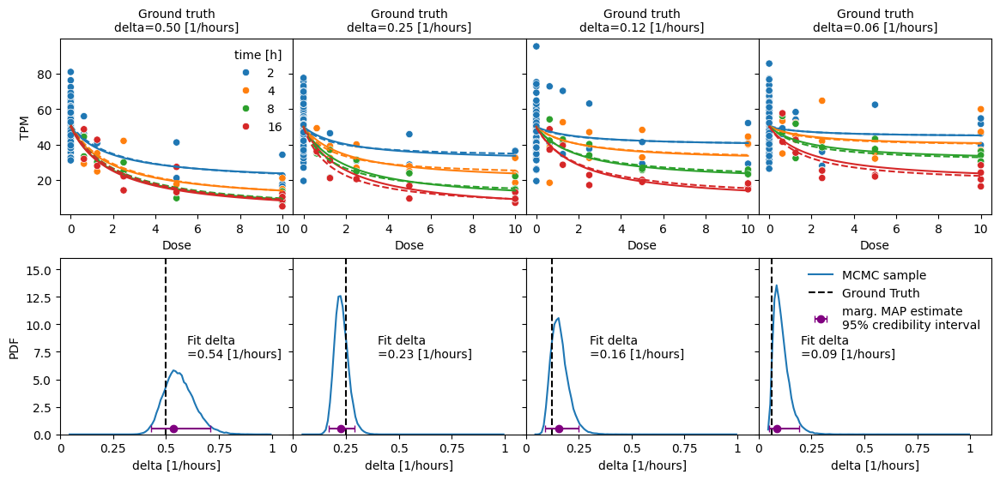

In [24]:
fig,ax=plt.subplots(2,len(res), figsize=(14,6), sharey='row')

time_points=sorted(list(set(df_meta_select['time'])))

for s in range(len(res)):
    df_combine=df_meta_select.copy()
    df_combine.loc[:,'tpm']=1E6*df_raw_select.iloc[s]/df_meta_select['scale']

    sns.scatterplot(ax=ax[0,s], data=df_combine, x='dose', y='tpm',hue='time', palette=sns.color_palette()[:len(time_points)], 
                    legend=(s==0))

    [tpm,phi,kd,ic50,delta]=gene_spec[s]  ## This is the ground truth

    dose_sweep=np.linspace(0,10,100)
    for i,t in enumerate(time_points):
        af=1.-np.exp(-t*delta)
        ax[0,s].plot(dose_sweep, (tpm) * (1-dose_sweep*(1.-kd)/(dose_sweep+ic50)*af), color=sns.color_palette()[i])

    [tpm,phi,kd,ic50,delta]=res[s]['analysis']['MAP estimate'] # this is the MAP estimate

    dose_sweep=np.linspace(0,10,100)
    for i,t in enumerate(time_points):
        af=1.-np.exp(-t*delta)
        ax[0,s].plot(dose_sweep, (tpm) * (1-dose_sweep*(1.-kd)/(dose_sweep+ic50)*af), '--', color=sns.color_palette()[i])

    ax[0,s].set_xlabel('Dose')
    
    if s==0:
        ax[0,s].set_ylabel('TPM')
        ax[0,s].legend(title='time [h]', frameon=False)
    ax[0,s].set_title(f'Ground truth\ndelta={gene_spec1[s][5]:.2f} [1/hours]', fontsize=10)
        
for i in range(len(res)):
    sample=res[i]['MCMC_sample']
    
    # do the analysis
    mv, hist, bins, mapEstimate, contours, binSelect, credibilityIntervals=analyze_MCMC(sample[:,4:5], binspec=[np.arange(0.04,1.001,0.01)])
    
    step=bins[0][1]-bins[0][0]
    ax[1,i].plot(0.5*(bins[0][1:]+bins[0][:-1]), hist/step, label='MCMC sample')
    ax[1,i].set_xlabel('delta [1/hours]')
    if i==0:
        ax[1,i].set_ylabel('PDF')
    
    ax[1,i].set_xlim(0,1.1)
    ax[1,i].set_xticks(np.arange(0,1.01,0.25),labels=['0','0.25','0.5','0.75','1'], minor=False)
    
    ax[1,i].plot([gene_spec1[i][5],gene_spec1[i][5]],[0,16],'--k', label='Ground Truth')
    ax[1,i].set_ylim(0,16)
    
    ax[1,i].errorbar([mapEstimate[0]],[0.5],xerr=[[mapEstimate[0]-credibilityIntervals[1][0][0]],[credibilityIntervals[1][0][1]-mapEstimate[0]]],capsize=3, fmt='o',
                   color='purple',label='marg. MAP estimate\n95% credibility interval')
    
    ax[1,i].text([0.6,0.4,0.3,0.2][i],7,f'Fit delta\n={mapEstimate[0]:.2f} [1/hours]')
    
    if i==3:
        ax[1,i].legend(frameon=False)
        
fig.subplots_adjust(wspace=0)
fig.subplots_adjust(hspace=0.25)
plt.savefig('fig_time.png', dpi=600)
plt.show()

## The three gene dose-response plots -- kd=[0, 0.5, 1] -- 72 replicas

In [23]:
gene_spec=np.array([[50,0.05,0,2.0]]*72+[[50,0.05,0.5,2.0]]*72+[[50,0.05,1.0,2.0]]*72)

np.random.seed(0) # this ensures that we generate the same data every time
gene_spec1, df_meta_select, df_raw_select=mk_samples(gene_spec)

aso=df_meta_select['aso'][0]

gene_list=df_raw_select.index
print(len(gene_list))
print(gene_list)

216
Index(['tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_0',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_1',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_2',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_3',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_4',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_5',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_6',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_7',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_8',
       'tpm:50.0_phi:0.05_kd:0.0_ic50:2.0_9',
       ...
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_206',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_207',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_208',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_209',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_210',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_211',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_212',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_213',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_214',
       'tpm:50.0_phi:0.05_kd:1.0_ic50:2.0_215'],
      dtype='object', name='gene_id', length

In [24]:
settings={
    'use_plate_dependent_tpm': False, 
    'use_outliers': False, 
    'outlier_fraction': 0.1, 
    'outlier_phi': 5, 
    'use_time': False,
    'mcmc_nwalkers': 40,
    'mcmc_nburn': 1000,
    'mcmc_nsteps': 5000,
    'return_MCMC_sample': True, 
    'return_MCMC_emcee_sampler':False, 
    'return_analysis': True, 
    'analysis_rfd_dose_list': [0.625, 1.25, 2.5, 5, 10],
    'analysis_rfd_p_val_threshold': 0.8
}

In [25]:
%%time

drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']))

args=np.array(df_raw_select)

pool = multiprocessing.Pool(n_cpu)

res2 = list(tqdm.tqdm(pool.imap(drs.run_mc, args), total=len(args)))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [06:28<00:00,  1.80s/it]

CPU times: user 3.59 s, sys: 5.36 s, total: 8.95 s
Wall time: 6min 28s


In [26]:
# with open('result2-3gene-story-v2','wb') as file:
#      pickle.dump(res2,file)

In [27]:
with open('result2-3gene-story-v2','rb') as file:
     res2=pickle.load(file)

MAP estimate: tpm=49.96571421900121, phi=0.03699767053035035, kd=0.0020519318274301954, ic50=2.17554864442497
ground truth: tpm=50.0, phi=0.05, kd=0.0, ic50=2.0
MAP estimate: tpm=51.240043156968554, phi=0.0637955406311681, kd=0.48111783165269106, ic50=0.8573505825248924
ground truth: tpm=50.0, phi=0.05, kd=0.5, ic50=2.0
MAP estimate: tpm=50.801701715934236, phi=0.0540796790498702, kd=0.9991086470447366, ic50=14.088343969779187
ground truth: tpm=50.0, phi=0.05, kd=1.0, ic50=2.0


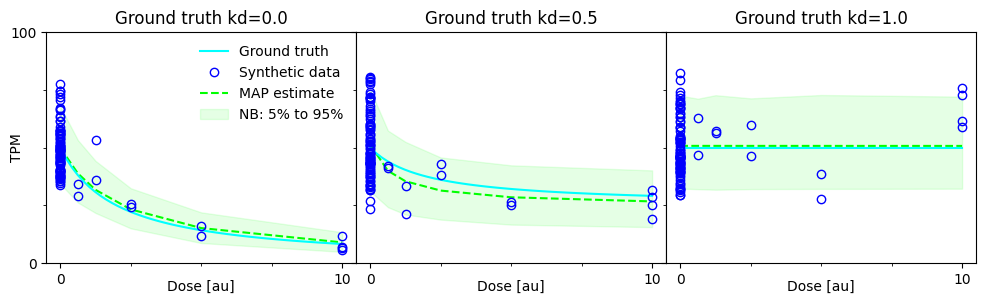

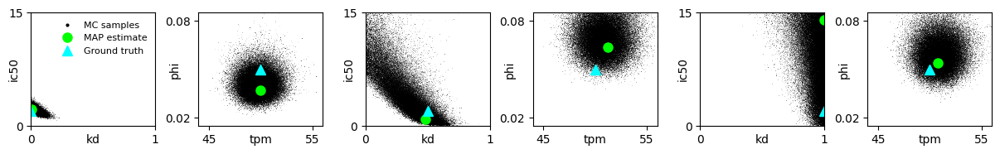

0.0 1.0 0.0 15.0
0.0 1.0 0.0 15.0
0.0 1.0 0.0 15.0


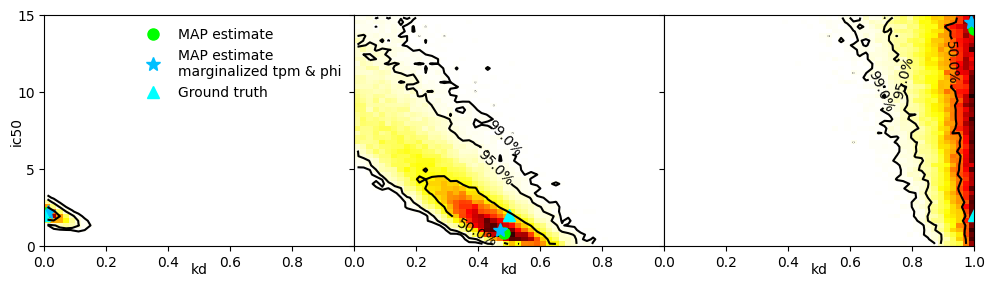

In [28]:
fig, ax = plt.subplots(1,3, figsize=(12,3), sharey='row')

for i,j in zip([0,72,144],[0,1,2]):
    make_dr_plot(ax[j],gene_spec[i], res2[i]['analysis']['MAP estimate'], gene_spec1[i][0], make_legend=(j==0), make_ylabel=(j==0))
    ax[j].yaxis.labelpad = -10
    ax[j].xaxis.labelpad = -5
    ax[j].set_xticks([0,10])
    ax[j].set_xticks([0,2.5,5,7.5,10], minor=True)
    ax[j].set_yticks([0,100])
    ax[j].set_yticks([0,25,50,75,100], minor=True)
# column titles
ax[0].set_title('Ground truth kd=0.0')
ax[1].set_title('Ground truth kd=0.5')
ax[2].set_title('Ground truth kd=1.0')

fig.subplots_adjust(wspace=0)

plt.savefig('fig_syn_MCMC_row1.png')
plt.show()

#######################################

fig, ax = plt.subplots(1,6, figsize=(12,1.8))

for i,j in zip([0,72,144],[0,1,2]):
    gene=gene_list[i]
    ground_truth=gene_spec1[i][1:]

    mk_kd_ic50_scatter_plot(ax[j*2], ground_truth, res2, gene, make_legend=(j==0))
    ax[j*2].yaxis.labelpad = -10
    ax[j*2].xaxis.labelpad = -10
    ax[j*2].set_xticks([0,1])
    ax[j*2].set_yticks([0,15])
    if j==0:
        ax[j*2].legend(loc='upper right',frameon=False, fontsize=8)

    mk_tpm_phi_scatter_plot(ax[j*2+1], ground_truth, res2, gene, make_legend=False)
    ax[j*2+1].set_xlim(44,56)
    ax[j*2+1].set_ylim(0.015,0.085)
    ax[j*2+1].yaxis.labelpad = -14
    ax[j*2+1].xaxis.labelpad = -10
    ax[j*2+1].set_xticks([45,55])
    ax[j*2+1].set_yticks([0.02,0.08])


plt.tight_layout(pad=0.5)
plt.savefig('fig_syn_MCMC_row2.png')
plt.show()

#######################################

fig, ax = plt.subplots(1,3, figsize=(12,3), sharey='row')

for i,j,loc in zip([0,72,144],[0,1,2],[[],[(0.5, 7), (0.45, 5), (0.4, 1)],[(0.95, 12), (0.85, 11), (0.7, 10)]]):
    gene=gene_list[i]
    ground_truth=gene_spec1[i][1:]
    mk_kd_ic50_contour_plot(ax[j], ground_truth, res2, gene, make_legend=(j==0), make_ylabel=(j==0),manual_locations = loc)

    ax[j].yaxis.labelpad = -5
    ax[j].xaxis.labelpad = -5
    if j==2:
        ax[j].set_xticks([0,0.2,0.4,0.6,0.8,1])
    else:
        ax[j].set_xticks([0,0.2,0.4,0.6,0.8])
    
    ax[j].set_yticks([0,5,10,15])
    
fig.subplots_adjust(wspace=0)

plt.savefig('fig_syn_MCMC_row3.png')
plt.show()

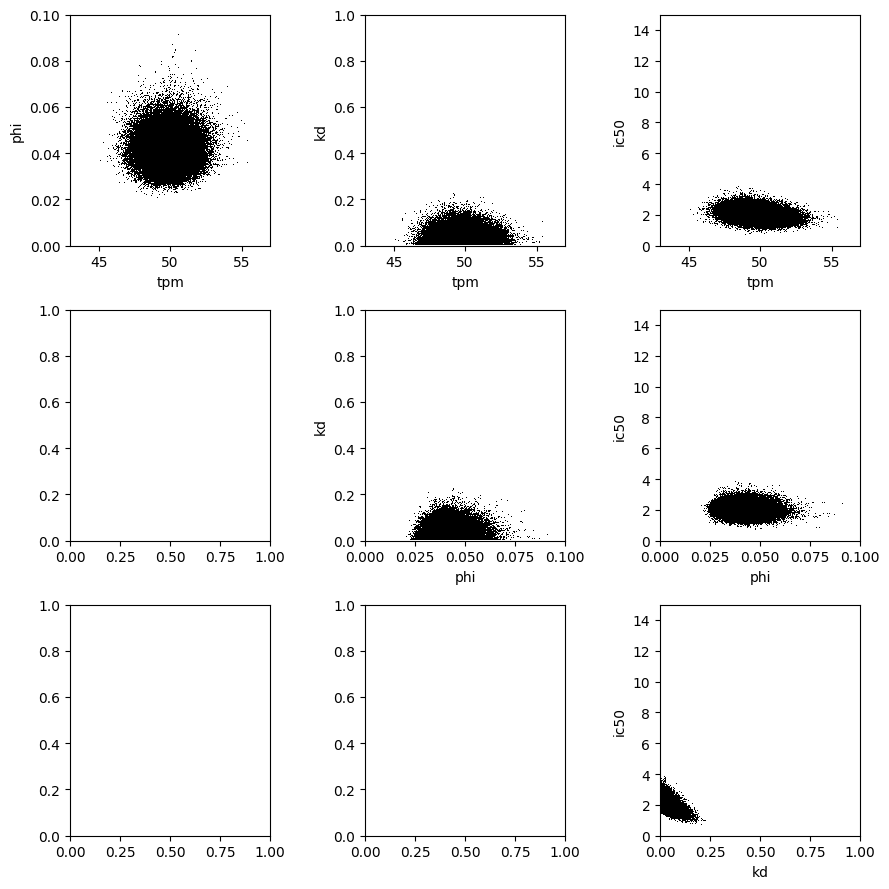

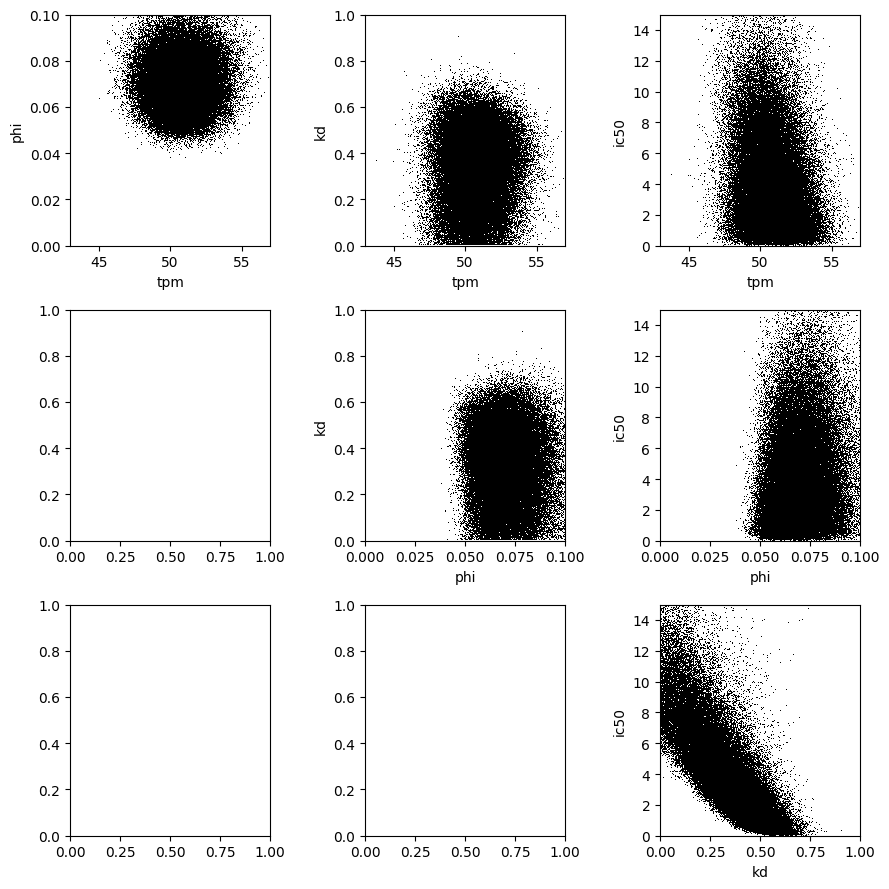

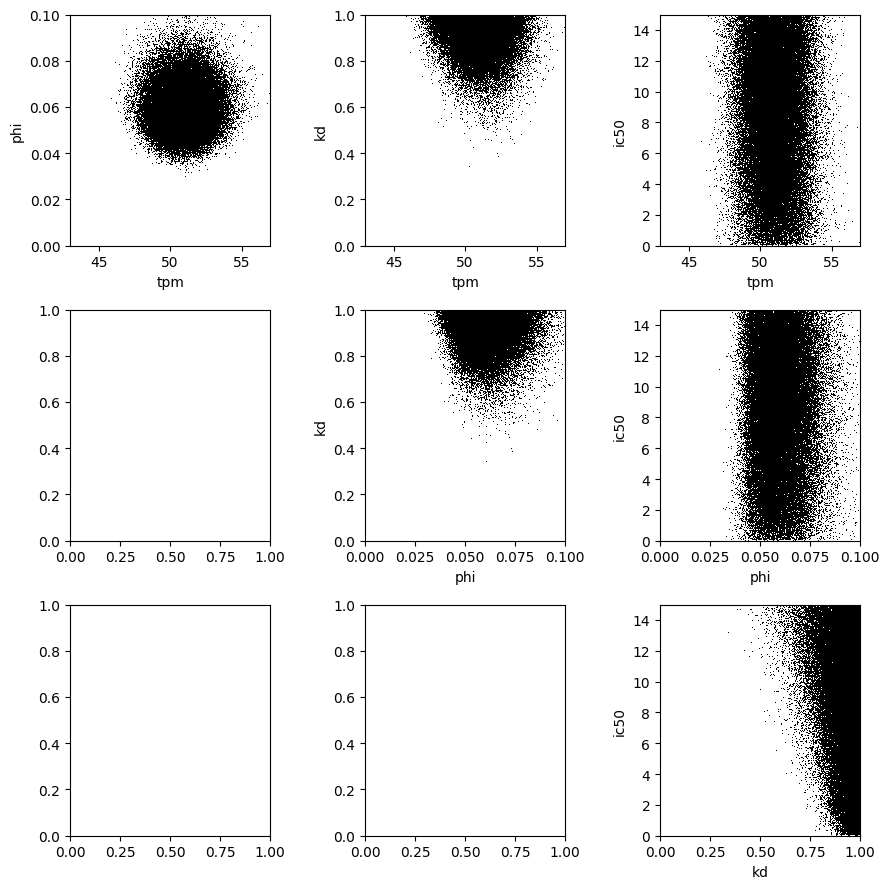

In [29]:
for s in [0,72,144]:
    fig, ax = plt.subplots(3,3, figsize=(9,9))
    labels=['tpm','phi','kd','ic50']
    lims=[[43,57],[0,0.1],[0,1],[0,15]]
    for i in range(3):
        for j in range(i+1,4):
            ax[i,j-1].plot(res2[s]['MCMC_sample'][:,i],res2[s]['MCMC_sample'][:,j],',k')

            ax[i,j-1].set_xlabel(labels[i])
            ax[i,j-1].set_ylabel(labels[j])

            ax[i,j-1].set_xlim(lims[i][0],lims[i][1])
            ax[i,j-1].set_ylim(lims[j][0],lims[j][1])

    plt.tight_layout()
    plt.savefig(f'correlations_test_{s}.png', dpi=300)
    plt.show()

/var/folders/pc/4806rk0n16l433qwz7lmzyc40000gn/T/ipykernel_62478/703900527.py:60: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


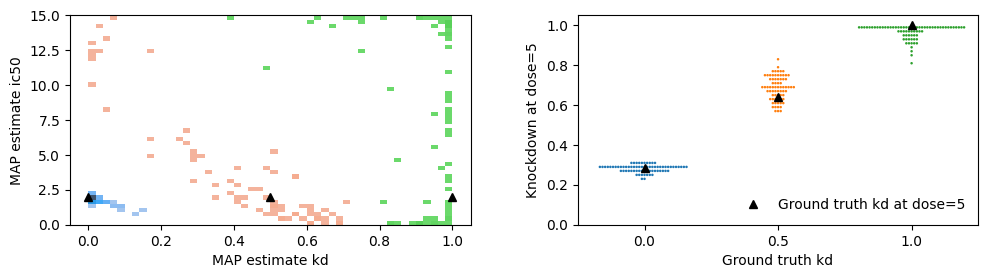

In [30]:
gs_kw = dict(width_ratios=[1.,1.])
fig, ax = plt.subplot_mosaic([['A', 'B']],
                              gridspec_kw=gs_kw, figsize=(12, 3),
                              layout="constrained")


df_map1=pd.DataFrame()

df_map1.loc[:,'kd']=np.array([res2[i]['analysis']['kd_ic50']['mapEstimate'][0] for i in np.arange(0,3*72)])
df_map1.loc[:,'ic50']=np.array([res2[i]['analysis']['kd_ic50']['mapEstimate'][1] for i in np.arange(0,3*72)])
df_map1.loc[0*72:1*72,'x']=0
df_map1.loc[1*72:2*72,'x']=0.5
df_map1.loc[2*72:3*72,'x']=1

#sns.stripplot(ax=ax['A'], x='kd', y='ic50', hue='x', data=df_map1, native_scale=True, palette=sns.color_palette()[:3], jitter=0, legend=False)
sns.histplot(ax=ax['A'], x='kd', y='ic50', hue='x', data=df_map1, palette=sns.color_palette()[:3], legend=False, bins=[np.arange(0,1.0001,1/50),np.arange(0,15.0001,15/50)])
ax['A'].plot([0.,0.5,1.0],[2,2,2],'^',color='black',markersize=6,label='Ground Truth',zorder=5)
ax['A'].set_xlabel('MAP estimate kd')
ax['A'].set_ylabel('MAP estimate ic50')

# kds=np.arange(0,1.001,0.01)
# t=0.85
# ax['A'].plot(kds,5*(kds-t)/(t-1))
ax['A'].set_ylim(0,15)
#sns.swarmplot(x='kd', y='ic50', hue='x', data=df_map1, native_scale=True, palette=sns.color_palette()[:3], size=2)
#ax['A'].legend(title='Ground truth kd')
#ax['A'].show()


df_map2=pd.DataFrame()
df_map2.loc[:,'map']=np.array([res2[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0] for i in np.arange(0,3*72)])
df_map2.loc[0*72:1*72,'x']=0
df_map2.loc[1*72:2*72,'x']=0.5
df_map2.loc[2*72:3*72,'x']=1
df_map2.loc[0*72:1*72,'l']='GT kd=0.0'
df_map2.loc[1*72:2*72,'l']='GT kd=0.5'
df_map2.loc[2*72:3*72,'l']='GT kd=1.0'
#sns.stripplot(x='x', y='map', hue='x', data=df_map2, palette=sns.color_palette()[:3])
sns.swarmplot(ax=ax['B'], x='x', y='map', hue='l', data=df_map2, native_scale=True, palette=sns.color_palette()[:3],\
              size=1.8,legend=False)


dose=5
ic50_i=2
ax['B'].plot([0.,0.5,1.0],[(1-dose*(1-0)/(dose+ic50_i)),(1-dose*(1-0.5)/(dose+ic50_i)),(1-dose*(1-1)/(dose+ic50_i))],\
         '^',color='black',markersize=6,label='Ground truth kd at dose=5',zorder=5)

# ax['B'].plot([-1],[-1],'o', label='GT kd=0.0')
# ax['B'].plot([-1],[-1],'o', label='GT kd=0.5')
# ax['B'].plot([-1],[-1],'o', label='GT kd=1.0')

ax['B'].legend(loc='lower right', frameon=False)
ax['B'].set_ylabel('Knockdown at dose=5')
ax['B'].set_xlabel('Ground truth kd')
ax['B'].set_ylim(0,1.05)
ax['B'].set_xlim(-0.25,1.25)
ax['B'].set_xticks([0,0.5,1])


plt.tight_layout()
fig.savefig('fig_syn_kd_ic50_v_dose5.png',dpi=600)
plt.show()

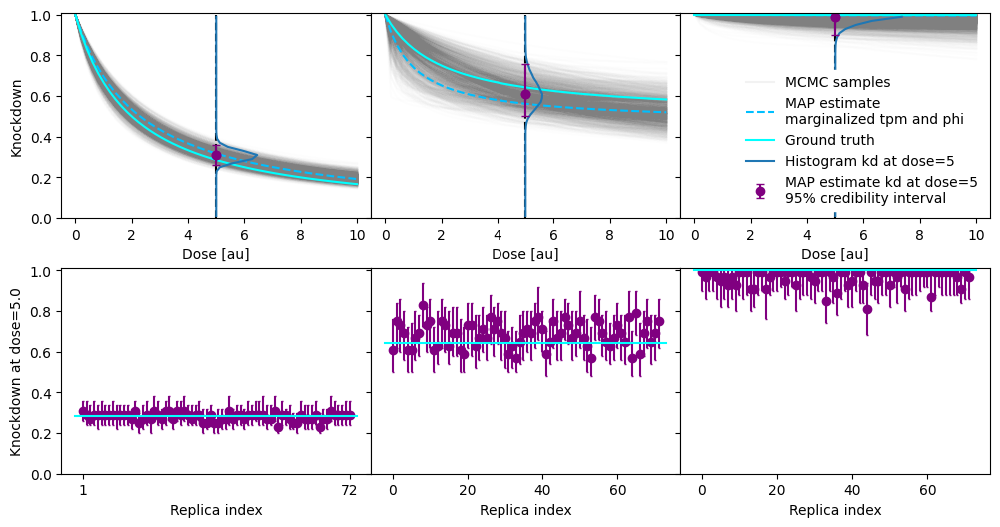

In [31]:
# gs_kw = dict(width_ratios=[1., 1., 1.])
# fig, ax = plt.subplot_mosaic([['A', 'B','C'], ['D', 'E', 'F']],
#                               gridspec_kw=gs_kw, figsize=(12, 6),
#                               layout="constrained")
fig, ax = plt.subplots(2,3, figsize=(12,6), sharey='row')

i=0
j=0
mk_response_curves_plot(ax[0,0], gene_spec[i], res2, gene_spec1[i][0],5, make_legend=False)
#mk_rfd_hist_plot(ax['B'], gene_spec[i], res2, gene_spec1[i][0], 5, make_legend=True)
mk_rfd_eb_plot(ax[1,0], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=False)
ax[1,0].set_xticks([0,71],[1,72])
#mk_rfd_meta_hist_plot(ax['D'], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=True)

i=72
j=1
mk_response_curves_plot(ax[0,1], gene_spec[i], res2, gene_spec1[i][0],5, make_legend=False, make_ylabel=False)
#mk_rfd_hist_plot(ax['F'], gene_spec[i], res2, gene_spec1[i][0], 5, make_legend=False)
mk_rfd_eb_plot(ax[1,1], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=False, make_ylabel=False)
#mk_rfd_meta_hist_plot(ax['H'], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=False)

i=144
j=2
mk_response_curves_plot(ax[0,2], gene_spec[i], res2, gene_spec1[i][0],5, make_legend=True, make_ylabel=False)
ax[0,2].legend(loc='lower right', frameon=True, framealpha=1, edgecolor='white')
#mk_rfd_hist_plot(ax['J'], gene_spec[i], res2, gene_spec1[i][0], 5, make_legend=True)
mk_rfd_eb_plot(ax[1,2], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=False, make_ylabel=False)
#mk_rfd_meta_hist_plot(ax['L'], gene_spec[i], res2, df_raw_select.index[72*(j):72*(j+1)], 5, make_legend=False)

fig.subplots_adjust(wspace=0)
fig.subplots_adjust(hspace=0.25)
fig.savefig('fig_syn_kd_dose5.png',dpi=600)

## sweeping parameters ...

In [32]:
ns=72*4
gene_spec=[[50,0.05,0.,2]]*ns+[[50,0.05,0.1,2]]*ns+[[50,0.05,0.2,2]]*ns+[[50,0.05,0.3,2]]*ns+[[50,0.05,0.4,2]]*ns+[[50,0.05,0.5,2]]*ns\
    +[[50,0.05,0.6,2]]*ns+[[50,0.05,0.7,2]]*ns+[[50,0.05,0.8,2]]*ns+[[50,0.05,0.9,2]]*ns+[[50,0.05,1.0,2]]*ns\
    +[[512,0.05,0.,2]]*ns+[[256,0.05,0.,2]]*ns+[[128,0.05,0.,2]]*ns+[[64,0.05,0.,2]]*ns+[[32,0.05,0.,2]]*ns+[[16,0.05,0.,2]]*ns\
    +[[8,0.05,0.,2]]*ns+[[4,0.05,0.,2]]*ns+[[2,0.05,0.,2]]*ns+[[1,0.05,0.,2]]*ns\
    +[[50,0.001,0.,2]]*ns+[[50,0.002,0.,2]]*ns+[[50,0.004,0.,2]]*ns+[[50,0.008,0.,2]]*ns+[[50,0.016,0.,2]]*ns+[[50,0.032,0.,2]]*ns\
    +[[50,0.064,0.,2]]*ns+[[50,0.128,0.,2]]*ns+[[50,0.256,0.,2]]*ns+[[50,0.512,0.,2]]*ns+[[50,1.024,0.,2]]*ns\
    +[[50,0.05,0.,1]]*ns+[[50,0.05,0.,2]]*ns+[[50,0.05,0.,3]]*ns+[[50,0.05,0.,4]]*ns+[[50,0.05,0.,5]]*ns+[[50,0.05,0.,6]]*ns+[[50,0.05,0.,7]]*ns\
    +[[50,0.05,0.,8]]*ns+[[50,0.05,0.,9]]*ns+[[50,0.05,0.,10]]*ns+[[50,0.05,0.,12]]*ns+[[50,0.05,0.,14]]*ns
np.random.seed(0) # this ensures that we generate the same data every time
gene_spec1, df_meta_select, df_raw_select=mk_samples(gene_spec)

aso=df_meta_select['aso'][0]

gene_list=df_raw_select.index
print(len(gene_list))
print(gene_list)

12672
Index(['tpm:50_phi:0.05_kd:0.0_ic50:2_0', 'tpm:50_phi:0.05_kd:0.0_ic50:2_1',
       'tpm:50_phi:0.05_kd:0.0_ic50:2_2', 'tpm:50_phi:0.05_kd:0.0_ic50:2_3',
       'tpm:50_phi:0.05_kd:0.0_ic50:2_4', 'tpm:50_phi:0.05_kd:0.0_ic50:2_5',
       'tpm:50_phi:0.05_kd:0.0_ic50:2_6', 'tpm:50_phi:0.05_kd:0.0_ic50:2_7',
       'tpm:50_phi:0.05_kd:0.0_ic50:2_8', 'tpm:50_phi:0.05_kd:0.0_ic50:2_9',
       ...
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12662',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12663',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12664',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12665',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12666',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12667',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12668',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12669',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12670',
       'tpm:50_phi:0.05_kd:0.0_ic50:14_12671'],
      dtype='object', name='gene_id', length=12672)


In [33]:
settings={
    'use_plate_dependent_tpm': False, 
    'use_outliers': False, 
    'outlier_fraction': 0.1, 
    'outlier_phi': 5, 
    'use_time': False,
    'mcmc_nwalkers': 40,
    'mcmc_nburn': 1000,
    'mcmc_nsteps': 5000,
    'return_MCMC_sample': False, 
    'return_MCMC_emcee_sampler':False, 
    'return_analysis': True, 
    'analysis_rfd_dose_list': [0.625, 1.25, 2.5, 5, 10],
    'analysis_rfd_p_val_threshold': 0.8
}

In [34]:
%%time

drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']))

args=np.array(df_raw_select)

pool = multiprocessing.Pool(n_cpu)

res3 = list(tqdm.tqdm(pool.imap(drs.run_mc, args), total=len(args)))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12672/12672 [6:24:35<00:00,  1.82s/it]

CPU times: user 30.5 s, sys: 10.7 s, total: 41.2 s
Wall time: 6h 24min 36s


In [35]:
with open('result3-parameter-sweep-3','wb') as file:
     pickle.dump(res3,file)

In [36]:
with open('result3-parameter-sweep-3','rb') as file:
     res3=pickle.load(file)

In [37]:
gsa=np.array(gene_spec)

In [38]:
res3[0]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]

0.26

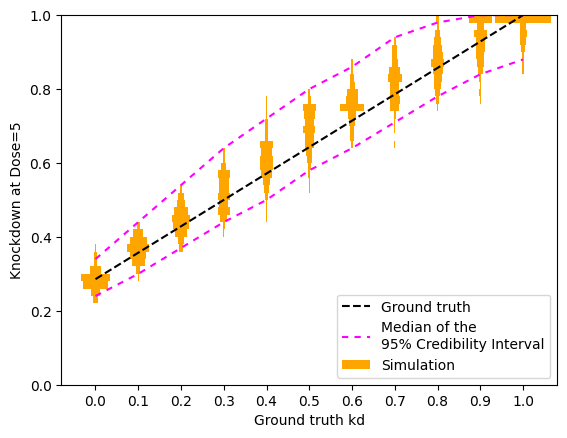

In [39]:
start=0
stop=ns*11
sc=0.2

# plot the measured knockdown
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Ground Truth kd']=gsa[start:stop,2]
df_scatter.loc[:,'Knockdown at Dose=5']=[r['analysis']['rfd']['rfd_5']['mapEstimate'][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 LB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 UB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for r in res3[start:stop]]
df_scatter.loc[:,'label']='Simulation'
#sns.swarmplot(x='Ground Truth kd',y='Knockdown at Dose=5',data=df_scatter,size=1,native_scale=True)

# Cycle through and plot each histogram
kd_list=sorted(list(set(df_scatter['Ground Truth kd'])))
for kd in kd_list:
    d1=df_scatter[df_scatter['Ground Truth kd']==kd]['Knockdown at Dose=5']
    hist,bins=np.histogram(d1, bins=np.arange(0,1.0001,0.02))
    hist=sc*hist/np.sum(hist)
    heights=bins[1]-bins[0]
    for i in range(len(hist)):
        if (i==0)&(kd==0):
            plt.barh(bins[i]+heights/2, hist[i], height=heights, left=kd-hist[i]/2,align='center',color='orange',label='Simulation')
        else:
            plt.barh(bins[i]+heights/2, hist[i], height=heights, left=kd-hist[i]/2,align='center',color='orange')

# plot the expected knockdown
dose=5
kd_sweep=np.arange(0,1.001,0.01)
ic50_i=gsa[start,3]
kd_5=(1-dose*(1-kd_sweep)/(dose+ic50_i))
plt.plot(kd_sweep,kd_5,'--k',label='Ground truth')

plt.xlim(-0.08,1.08)
plt.ylim(0,1)

plt.xlabel('Ground truth kd')
plt.ylabel('Knockdown at Dose=5')

plt.xticks(ticks=kd_list, labels=kd_list, minor=False)
plt.xticks(ticks=[], minor=True)

ci_df=df_scatter[['Ground Truth kd','KD Dose=5 LB','KD Dose=5 UB']].groupby('Ground Truth kd').median()
sns.lineplot(x='Ground Truth kd', y='KD Dose=5 LB', data=ci_df, color='magenta', dashes=(3,3), label='Median of the\n95% Credibility Interval')
sns.lineplot(x='Ground Truth kd', y='KD Dose=5 UB', data=ci_df, color='magenta', dashes=(3,3))

plt.legend(loc='lower right')
plt.savefig('kd-sweep-v1.pdf')

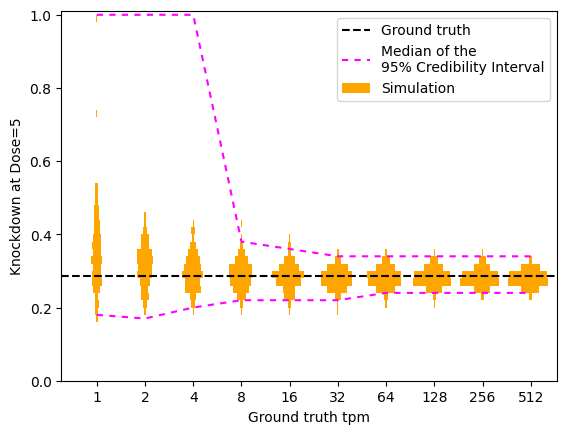

In [40]:
start=ns*11
stop=ns*(11+10)
sc=1.3

# plot the measured knockdown
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Ground Truth tpm']=gsa[start:stop,0]
df_scatter.loc[:,'Knockdown at Dose=5']=[r['analysis']['rfd']['rfd_5']['mapEstimate'][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 LB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 UB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for r in res3[start:stop]]
df_scatter.loc[:,'label']='Simulation'
#sns.swarmplot(x='Ground Truth kd',y='Knockdown at Dose=5',data=df_scatter,size=1,native_scale=True)

# Cycle through and plot each histogram
tpm_list=sorted(list(set(df_scatter['Ground Truth tpm'])))
for tpm in tpm_list:
    d1=df_scatter[df_scatter['Ground Truth tpm']==tpm]['Knockdown at Dose=5']
    hist,bins=np.histogram(d1, bins=np.arange(0,1.001,0.02))
    heights=bins[1]-bins[0]
    hist=sc*hist/(np.sum(hist))
    for i in range(len(hist)):
        if (i==0)&(tpm==512.):
            plt.barh(bins[i]+heights/2,  tpm*hist[i]*sc, height=heights, left=tpm-tpm*hist[i]*sc/2,align='center',color='orange',label='Simulation')
        else:
            plt.barh(bins[i]+heights/2, tpm*hist[i]*sc, height=heights, left=tpm-tpm*hist[i]*sc/2,align='center',color='orange')

plt.xscale('log')
# plot the expected knockdown
dose=5
kd_i=gsa[start,2]
ic50_i=gsa[start,3]
kd_5=(1-dose*(1-kd_i)/(dose+ic50_i))
plt.plot([0.6,750],[kd_5,kd_5],'--k',label='Ground truth')

plt.xlim(0.6,750)
plt.ylim(0,1.01)

plt.xlabel('Ground truth tpm')
plt.ylabel('Knockdown at Dose=5')

plt.xticks(ticks=tpm_list, labels=[int(t) for t in tpm_list], minor=False)
plt.xticks(ticks=[], minor=True)

ci_df=df_scatter[['Ground Truth tpm','KD Dose=5 LB','KD Dose=5 UB']].groupby('Ground Truth tpm').median()
sns.lineplot(x='Ground Truth tpm', y='KD Dose=5 LB', data=ci_df, color='magenta', dashes=(3,3), label='Median of the\n95% Credibility Interval')
sns.lineplot(x='Ground Truth tpm', y='KD Dose=5 UB', data=ci_df, color='magenta', dashes=(3,3))

plt.legend(loc='upper right')
plt.savefig('tpm-sweep-v1.pdf')

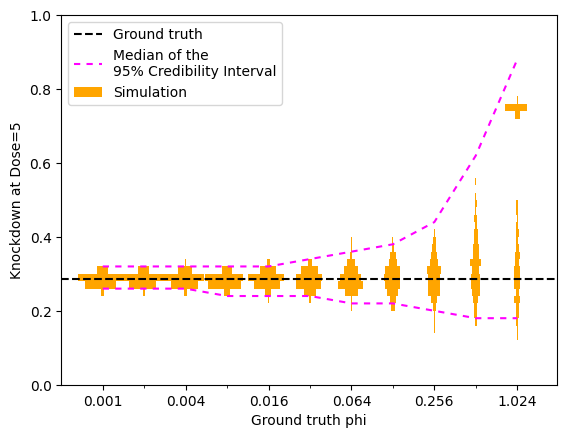

In [41]:
start=ns*(11+10)
stop=ns*(11+10+11)
sc=1.2

# plot the measured knockdown
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Ground Truth phi']=gsa[start:stop,1]
df_scatter.loc[:,'Knockdown at Dose=5']=[r['analysis']['rfd']['rfd_5']['mapEstimate'][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 LB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 UB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for r in res3[start:stop]]
df_scatter.loc[:,'label']='Simulation'
#sns.swarmplot(x='Ground Truth kd',y='Knockdown at Dose=5',data=df_scatter,size=1,native_scale=True)

# Cycle through and plot each histogram
phi_list=sorted(list(set(df_scatter['Ground Truth phi'])))
for phi in phi_list:
    d1=df_scatter[df_scatter['Ground Truth phi']==phi]['Knockdown at Dose=5']
    hist,bins=np.histogram(d1, bins=np.arange(0,1.001,0.02))
    heights=bins[1]-bins[0]
    hist=sc*hist/(np.sum(hist))
    for i in range(len(hist)):
        if (i==0)&(phi==0.001):
            plt.barh(bins[i]+heights/2,  phi*hist[i]*sc, height=heights, left=phi-phi*hist[i]*sc/2,align='center',color='orange',label='Simulation')
        else:
            plt.barh(bins[i]+heights/2, phi*hist[i]*sc, height=heights, left=phi-phi*hist[i]*sc/2,align='center',color='orange')

plt.xscale('log')
# plot the expected knockdown
dose=5
kd_i=gsa[start,2]
ic50_i=gsa[start,3]
kd_5=(1-dose*(1-kd_i)/(dose+ic50_i))
plt.plot([0.0005,2],[kd_5,kd_5],'--k',label='Ground truth')

plt.xlim(0.0005,2)
plt.ylim(0,1)

plt.xlabel('Ground truth phi')
plt.ylabel('Knockdown at Dose=5')

plt.xticks(ticks=np.array(phi_list)[::2], labels=np.array(phi_list)[::2], minor=False)
plt.xticks(ticks=phi_list, labels=[],minor=True)

ci_df=df_scatter[['Ground Truth phi','KD Dose=5 LB','KD Dose=5 UB']].groupby('Ground Truth phi').median()
sns.lineplot(x='Ground Truth phi', y='KD Dose=5 LB', data=ci_df, color='magenta', dashes=(3,3), label='Median of the\n95% Credibility Interval')
sns.lineplot(x='Ground Truth phi', y='KD Dose=5 UB', data=ci_df, color='magenta', dashes=(3,3))

plt.legend(loc='upper left')
plt.savefig('phi-sweep-v1.pdf')

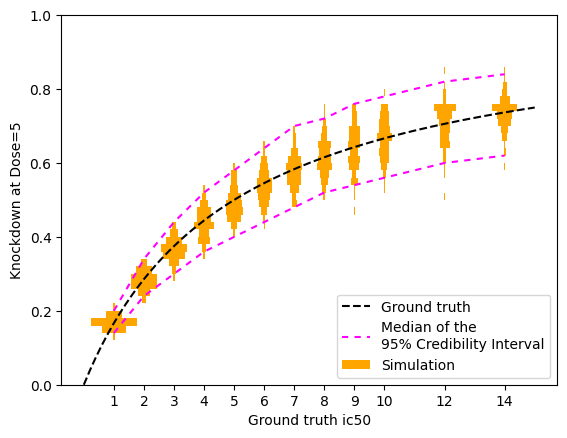

In [42]:
start=ns*(11+10+11)
stop=ns*(11+10+11+12)
sc=3

# plot the measured knockdown
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Ground Truth ic50']=gsa[start:stop,3]
df_scatter.loc[:,'Knockdown at Dose=5']=[r['analysis']['rfd']['rfd_5']['mapEstimate'][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 LB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for r in res3[start:stop]]
df_scatter.loc[:,'KD Dose=5 UB']=[r['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for r in res3[start:stop]]
df_scatter.loc[:,'label']='Simulation'
#sns.swarmplot(x='Ground Truth kd',y='Knockdown at Dose=5',data=df_scatter,size=1,native_scale=True)

# Cycle through and plot each histogram
ic50_list=sorted(list(set(df_scatter['Ground Truth ic50'])))
for ic50 in ic50_list:
    d1=df_scatter[df_scatter['Ground Truth ic50']==ic50]['Knockdown at Dose=5']
    hist,bins=np.histogram(d1, bins=np.arange(0,1.0001,0.02))
    hist=sc*hist/np.sum(hist)
    heights=bins[1]-bins[0]
    for i in range(len(hist)):
        if (i==0)&(ic50==ic50_list[0]):
            plt.barh(bins[i]+heights/2, hist[i], height=heights, left=ic50-hist[i]/2,align='center',color='orange',label='Simulation')
        else:
            plt.barh(bins[i]+heights/2, hist[i], height=heights, left=ic50-hist[i]/2,align='center',color='orange')

# plot the expected knockdown
dose=5
kd_i=gsa[start,2]
ic50_sweep=np.arange(0,15.001,0.1)
kd_5=(1-dose*(1-kd_i)/(dose+ic50_sweep))
plt.plot(ic50_sweep,kd_5,'--k',label='Ground truth')

#plt.xlim(-0.08,1.08)
plt.ylim(0,1)

plt.xlabel('Ground truth ic50')
plt.ylabel('Knockdown at Dose=5')

plt.xticks(ticks=np.array(ic50_list), labels=np.array(ic50_list, dtype=int), minor=False)
plt.xticks(ticks=[], labels=[],minor=True)

ci_df=df_scatter[['Ground Truth ic50','KD Dose=5 LB','KD Dose=5 UB']].groupby('Ground Truth ic50').median()
sns.lineplot(x='Ground Truth ic50', y='KD Dose=5 LB', data=ci_df, color='magenta', dashes=(3,3), label='Median of the\n95% Credibility Interval')
sns.lineplot(x='Ground Truth ic50', y='KD Dose=5 UB', data=ci_df, color='magenta', dashes=(3,3))

plt.legend(loc='lower right')
plt.savefig('ic50-sweep-v1.pdf')

## sweeping number of samples ...

### Number sweep, same number at each dose

In [43]:
settings={
    'use_plate_dependent_tpm': False, 
    'use_outliers': False, 
    'outlier_fraction': 0.1, 
    'outlier_phi': 5, 
    'use_time': False,
    'mcmc_nwalkers': 40,
    'mcmc_nburn': 1000,
    'mcmc_nsteps': 5000,
    'return_MCMC_sample': False, 
    'return_MCMC_emcee_sampler':False, 
    'return_analysis': True, 
    'analysis_rfd_dose_list': [0.625, 1.25, 2.5, 5, 10],
    'analysis_rfd_p_val_threshold': 0.8
}

In [44]:
# check if having more copies of everything helps?
ds0=[0,0.625,1.25,2.5,5,10]
dose_spec_list=[sorted(ds0*2),sorted(ds0*4),sorted(ds0*8),sorted(ds0*16),sorted(ds0*32),sorted(ds0*64),sorted(ds0*128)]

ns=72*4
gene_spec=[[50,0.05,0.,2]]*ns+[[50,0.05,0.5,2]]*ns+[[50,0.05,1.0,2]]*ns

In [45]:
%%time

res_n_sweep=[]

for dose_index in np.arange(0,len(dose_spec_list)):
    np.random.seed(0) # this ensures that we generate the same data every time
    gene_spec1, df_meta_select, df_raw_select=mk_samples(gene_spec, dose_spec=dose_spec_list[dose_index])

    aso=df_meta_select['aso'][0]

    gene_list=df_raw_select.index
    print('Length gene list:',len(gene_list))
    print('Number samples: ',len(df_meta_select))
    
    drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']))

    args=np.array(df_raw_select)

    pool = multiprocessing.Pool(n_cpu)
    res_n = list(tqdm.tqdm(pool.imap(drs.run_mc, args), total=len(args)))
    
    res_n_sweep.append(res_n)

Length gene list: 864
Number samples:  12


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [07:07<00:00,  2.02it/s]

Length gene list: 864
Number samples:  24



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [09:49<00:00,  1.47it/s]

Length gene list: 864
Number samples:  48



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [14:52<00:00,  1.03s/it]

Length gene list: 864
Number samples:  96



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [25:00<00:00,  1.74s/it]


Length gene list: 864
Number samples:  192


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [46:05<00:00,  3.20s/it]


Length gene list: 864
Number samples:  384


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [1:25:56<00:00,  5.97s/it]


Length gene list: 864
Number samples:  768


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 864/864 [2:40:47<00:00, 11.17s/it]

CPU times: user 16.2 s, sys: 9.17 s, total: 25.4 s
Wall time: 5h 49min 51s


In [46]:
with open('result4-number-sweep-3','wb') as file:
     pickle.dump(res_n_sweep,file)

In [47]:
with open('result4-number-sweep-3','rb') as file:
     res_n_sweep=pickle.load(file)

In [48]:
kd_list1=[]
for dose_index in np.arange(0,len(dose_spec_list)):
    np.random.seed(0) # this ensures that we generate the same data every time
    gene_spec1, df_meta_select, df_raw_select=mk_samples(gene_spec, dose_spec=dose_spec_list[dose_index])
    kd_list1=kd_list1+[g[3] for g in gene_spec1]

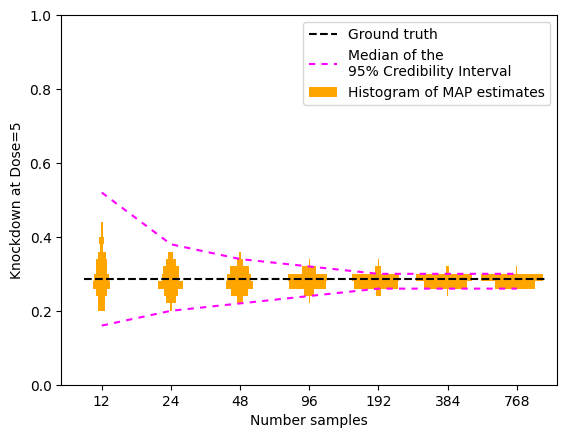

In [49]:
sc=1.

# plot the measured knockdown
dose_list1=list(df_meta_select['dose'])*3
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Number samples']=np.array([[len(ds)]*ns*3 for ds in dose_spec_list]).reshape(-1)
df_scatter.loc[:,'Knockdown at Dose=5']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['mapEstimate'][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'KD Dose=5 LB']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'KD Dose=5 UB']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'Ground Truth kd']=kd_list1
df_scatter.loc[:,'label']='Simulation'
n_list=df_scatter['Number samples'].unique()

fig, ax=plt.subplots(1,1)

for n in n_list:
    d1=df_scatter[(df_scatter['Number samples']==n)&(df_scatter['Ground Truth kd']==0.)]['Knockdown at Dose=5']
    hist,bins=np.histogram(d1, bins=np.arange(0,1.001,0.02))
    my_hist_plot(ax, hist, bins, sc, shift=n, label=('Histogram of MAP estimates' if n==12 else None))
    
plt.xscale('log')
# plot the expected knockdown
dose=5
kd_i=0
ic50_i=2
kd_5=(1-dose*(1-kd_i)/(dose+ic50_i))
plt.plot([10,1024],[kd_5,kd_5],'--k',label='Ground truth')
plt.xticks(ticks=[len(ds) for ds in dose_spec_list], labels=[len(ds) for ds in dose_spec_list], minor=False)
plt.xticks(ticks=[], minor=True)

plt.xlim(8,1152)
plt.ylim(0.0,1)

plt.xlabel('Number samples')
plt.ylabel('Knockdown at Dose=5')

ci_df=df_scatter[df_scatter['Ground Truth kd']==0.][['Number samples','KD Dose=5 LB','KD Dose=5 UB']].groupby('Number samples').median()
sns.lineplot(x='Number samples', y='KD Dose=5 LB', data=ci_df, color='magenta', dashes=(3,3), label='Median of the\n95% Credibility Interval')
sns.lineplot(x='Number samples', y='KD Dose=5 UB', data=ci_df, color='magenta', dashes=(3,3))

plt.legend(loc='upper right')
plt.savefig('n-sweep-v1.pdf')

In [50]:
# plot the measured knockdown
df_scatter=pd.DataFrame()
df_scatter.loc[:,'Number samples']=np.array([[len(ds)]*ns*3 for ds in dose_spec_list]).reshape(-1)
df_scatter.loc[:,'Knockdown at Dose=5']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['mapEstimate'][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'Knockdown at Dose=5 LB']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'Knockdown at Dose=5 UB']=np.array([[res_n_sweep[i][j]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'kd']=np.array([[res_n_sweep[i][j]['analysis']['kd_ic50']['mapEstimate'][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'kd LB']=np.array([[res_n_sweep[i][j]['analysis']['kd_ic50']['credibilityIntervals'][0][0] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'kd UB']=np.array([[res_n_sweep[i][j]['analysis']['kd_ic50']['credibilityIntervals'][0][1] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'ic50']=np.array([[res_n_sweep[i][j]['analysis']['kd_ic50']['mapEstimate'][1] for j in range(len(res_n_sweep[i]))] for i in range(len(res_n_sweep))]).reshape(-1)
df_scatter.loc[:,'Ground Truth kd']=kd_list1

df_scatter.loc[:,'label']='Simulation'

In [51]:
df_scatter.head()

,Number samples,Knockdown at Dose=5,Knockdown at Dose=5 LB,Knockdown at Dose=5 UB,kd,kd LB,kd UB,ic50,Ground Truth kd,label
0,12,0.23,0.14,0.38,0.01,0.0,0.16,1.35,0.0,Simulation
1,12,0.39,0.28,0.56,0.09,0.0,0.34,2.25,0.0,Simulation
2,12,0.31,0.18,0.54,0.05,0.0,0.32,1.65,0.0,Simulation
3,12,0.35,0.20,0.58,0.09,0.0,0.44,1.65,0.0,Simulation
4,12,0.39,0.30,0.50,0.03,0.0,0.22,2.85,0.0,Simulation


kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288
kd=0  number=288
kd=0.5  number=288
kd=1  number=288


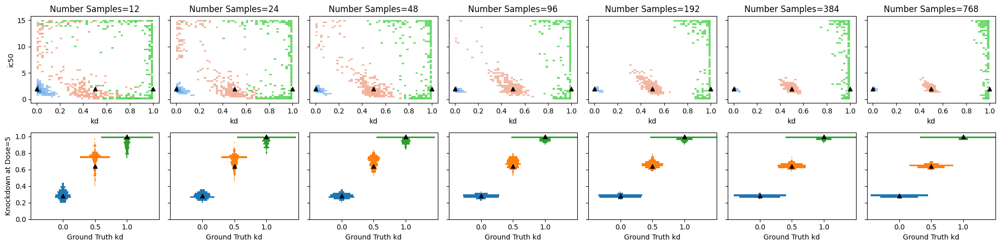

In [52]:
fig, ax = plt.subplots(2,len(n_list), sharex=False, sharey='row', figsize=(20,5))

for i,n in enumerate(n_list):
    sns.histplot(ax=ax[0,i], x='kd', y='ic50', hue='Ground Truth kd', data=df_scatter[df_scatter['Number samples']==n], 
                 legend=False, bins=[np.arange(0,1.0001,1/50),np.arange(0,15.0001,15/50)], palette=sns.color_palette()[:3]) 
    ax[0,i].set_title(f'Number Samples={n}')
    ax[0,i].plot([0.,0.5,1.0],[2,2,2],'^',color='black',markersize=6,label='Ground Truth',zorder=5)

    for j,kd in enumerate([0,0.5,1]):
        d1=df_scatter[(df_scatter['Number samples']==n)&(df_scatter['Ground Truth kd']==kd)]['Knockdown at Dose=5']
        print(f'kd={kd}  number={len(d1)}')
        hist,bins=np.histogram(d1, bins=np.arange(0,1.001,0.02))
        my_hist_plot(ax[1,i], hist, bins, 1.5, shift=kd, log_scale=False, label=None,color=sns.color_palette()[j])
    ax[1,i].set_xlim(-0.5,1.5)
    ax[1,i].set_ylim(0,1.05)
    ax[1,i].set_xticks([0,0.5,1])
    if i==0:
        ax[1,i].set_ylabel('Knockdown at Dose=5')
    ax[1,i].set_xlabel('Ground Truth kd')    
    dose=5
    ic50_i=2
    ax[1,i].plot([0.,0.5,1.0],[(1-dose*(1-0)/(dose+ic50_i)),(1-dose*(1-0.5)/(dose+ic50_i)),(1-dose*(1-1)/(dose+ic50_i))],\
             '^',color='black',markersize=6,label='Ground truth kd at dose=5',zorder=5)

plt.tight_layout()
plt.savefig('n-sweep-histograms-v1.pdf')
plt.show()

## Analysis of experimental data

In [53]:
df_raw_select=pd.read_csv('df_raw_select_unlabeled.csv')
df_meta_select=pd.read_csv('df_meta_select_unlabeled.csv')

In [54]:
settings={
    'use_plate_dependent_tpm': True, 
    'use_outliers': False, 
    'outlier_fraction': 0.1, 
    'outlier_phi': 5, 
    'use_time': False,
    'mcmc_nwalkers': 40,
    'mcmc_nburn': 1000,
    'mcmc_nsteps': 5000,
    'return_MCMC_sample': False, 
    'return_MCMC_emcee_sampler':False, 
    'return_analysis': True, 
    'analysis_rfd_dose_list': [0.625, 1.25, 2.5, 5, 10],
    'analysis_rfd_p_val_threshold': 0.8
}

In [55]:
drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']),
        plates=np.array(df_meta_select['plate_index']))

In [56]:
print('Number of samples :', len(drs.all_dose))
doses=sorted(list(set(drs.all_dose)))
for d in doses:
    print(f'Dose={d}   Number samples={np.sum(drs.all_dose==d)}')

print(f'Min scale={min(drs.all_scale)}  Max scale={max(drs.all_scale)}  Mean scale={np.mean(drs.all_scale)}')
print(f'Number genes selected={len(df_raw_select)}')

Number of samples : 121
Dose=0.0   Number samples=110
Dose=0.625   Number samples=2
Dose=1.25   Number samples=2
Dose=2.5   Number samples=1
Dose=5.0   Number samples=2
Dose=10.0   Number samples=4
Min scale=487172  Max scale=8929017  Mean scale=3215902.4628099175
Number genes selected=8005


In [57]:
df_meta_select.head()

,sample_id,dose,aso,plate_index,scale
0,Sample 0,0.0,Control,1,5632551
1,Sample 1,0.0,Control,1,4509225
2,Sample 2,0.0,Control,1,8328958
3,Sample 3,0.0,Control,4,4032754
4,Sample 4,0.0,Control,1,6020612


In [58]:
df_raw_select.head()

,Sample 0,Sample 1,Sample 2,Sample 3,Sample 4,Sample 5,Sample 6,Sample 7,Sample 8,Sample 9,...,Sample 111,Sample 112,Sample 113,Sample 114,Sample 115,Sample 116,Sample 117,Sample 118,Sample 119,Sample 120
0,302,207,445,359,324,468,659,414,38,25,...,242,47,48,129,57,46,304,318,330,282
1,1015,679,1267,449,933,1278,640,440,61,56,...,337,101,63,155,97,87,440,350,443,894
2,163,133,308,154,200,304,272,185,14,15,...,138,32,17,88,35,6,185,125,226,198
3,314,280,480,322,359,550,453,378,45,57,...,320,99,60,151,92,46,379,392,414,356
4,105,19,63,172,44,79,82,52,2,2,...,16,7,1,109,9,5,64,48,48,112


In [59]:
%%time
# run on all high expression (tpm>10) genes, obtain kd and ic50

drs=DoReSeq(settings, 
        scale=np.array(df_meta_select['scale']),
        dose=np.array(df_meta_select['dose']),
        plates=np.array(df_meta_select['plate_index']))

args=np.array(df_raw_select)

pool = multiprocessing.Pool(n_cpu)

res_all = list(tqdm.tqdm(pool.imap(drs.run_mc, args), total=len(args)))

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8005/8005 [4:22:48<00:00,  1.97s/it]

CPU times: user 19.8 s, sys: 8.77 s, total: 28.6 s
Wall time: 4h 22min 49s


In [60]:
with open('result5-expdata-1','wb') as file:
     pickle.dump(res_all,file)

In [61]:
with open('result5-expdata-1','rb') as file:
     res_all=pickle.load(file)

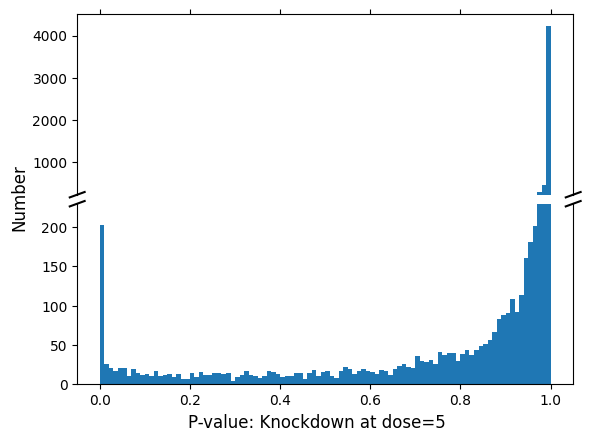

In [62]:
#Plot the histogram with split axis
#From: https://matplotlib.org/3.1.1/gallery/subplots_axes_and_figures/broken_axis.html

# If we were to simply plot pts, we'd lose most of the interesting
# details due to the outliers. So let's 'break' or 'cut-out' the y-axis
# into two portions - use the top (ax) for the outliers, and the bottom
# (ax2) for the details of the majority of our data
f, (ax, ax2) = plt.subplots(2, 1, sharex=True)

# plot the same data on both axes
ax.hist([r['analysis']['rfd']['rfd_5']['estimated_p_val'] for r in res_all], bins=np.arange(0,1.001, 0.01))
ax2.hist([r['analysis']['rfd']['rfd_5']['estimated_p_val'] for r in res_all], bins=np.arange(0,1.001, 0.01))

# zoom-in / limit the view to different portions of the data
ax.set_ylim(230, 4500)  # outliers only
ax2.set_ylim(0, 230)  # most of the data

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.xaxis.tick_top()
ax.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

# This looks pretty good, and was fairly painless, but you can get that
# cut-out diagonal lines look with just a bit more work. The important
# thing to know here is that in axes coordinates, which are always
# between 0-1, spine endpoints are at these locations (0,0), (0,1),
# (1,0), and (1,1).  Thus, we just need to put the diagonals in the
# appropriate corners of each of our axes, and so long as we use the
# right transform and disable clipping.

d = .015  # how big to make the diagonal lines in axes coordinates
# arguments to pass to plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagonal

# What's cool about this is that now if we vary the distance between
# ax and ax2 via f.subplots_adjust(hspace=...) or plt.subplot_tool(),
# the diagonal lines will move accordingly, and stay right at the tips
# of the spines they are 'breaking'

f.supxlabel('P-value: Knockdown at dose=5')
f.supylabel('Number')

f.subplots_adjust(hspace=0.05)
plt.savefig('fig_exp_hist_v2.png',dpi=600, bbox_inches="tight")
plt.show()

### P-value at dose 5

In [63]:
p_val_5_list=np.array([r['analysis']['rfd']['rfd_5']['estimated_p_val'] for r in res_all])

In [64]:
mean_tpm=np.array([np.mean(res_all[i]['analysis']['MAP estimate'][:8]) for i in range(len(res_all))])

In [65]:
small_p_iloc=np.where(p_val_5_list<0.01)[0]
med_p_iloc=np.where((p_val_5_list>0.1) & (p_val_5_list<0.2))[0]
large_p_iloc=np.where(p_val_5_list>0.99)[0]

print(len(small_p_iloc), len(med_p_iloc), len(large_p_iloc))

203 108 4229


In [66]:
# select genes that have consistent mean tpm of ~ 50

small_p_iloc=np.where((p_val_5_list<0.0000001) & (np.abs(mean_tpm-50)<5))[0]
med_p_iloc=np.where((p_val_5_list>0.1) & (p_val_5_list<0.2)& (np.abs(mean_tpm-50)<5))[0]
large_p_iloc=np.where((p_val_5_list>0.9999999) & (np.abs(mean_tpm-50)<5))[0]

print(len(small_p_iloc), len(med_p_iloc), len(large_p_iloc))

12 5 109


In [67]:
np.random.seed(0)
gene_select=np.array([np.random.choice(small_p_iloc,size=1, replace=False),
                      np.random.choice(med_p_iloc,size=1, replace=False),
                      np.random.choice(large_p_iloc,size=1, replace=False)]).reshape(-1)
print(gene_select)
print(p_val_5_list[gene_select])
[np.mean(res_all[i]['analysis']['MAP estimate'][:8]) for i in gene_select]

[6827 5320 2779]
[0.         0.14263125 1.        ]


[47.898696302838886, 47.10097685207549, 53.10012209058609]

In [68]:
def get_map_parameters(MAP_estimate):
    # extract the map parameters
    n_plates=len(MAP_estimate)-3
    tpm_list=MAP_estimate[:n_plates]
    phi=MAP_estimate[n_plates]
    kd=MAP_estimate[n_plates+1]
    ic50=MAP_estimate[n_plates+2]
    
    tpm_mean=np.mean(tpm_list)
    
    return [tpm_list, phi, kd, ic50, tpm_mean]

def simulate_map_distribution(map_parameters, df_combined):
    # this function simulates NB distribution around the MAP_estimate
    # so that we can measure the width of the NB distribution
    [tpm_list, phi, kd, ic50, tpm_mean]=map_parameters
    

    # do the simulation and aggregate the results
    df_sim_data=pd.DataFrame()
    for dose, scale, plate_index,clv in zip(df_combined['dose'], df_combined['scale'], df_combined['plate_index'], df_combined['cl']):
        mu=(1E-6)*scale*tpm_list[plate_index]*(1 - (dose * (1 - kd)) / (dose + ic50))

        raw_counts=np.random.negative_binomial(1./phi, 1./(1.+ mu*phi),1000)

        df_sim_data1=pd.DataFrame()
        df_sim_data1.loc[:,'raw_counts']=raw_counts
        df_sim_data1.loc[:,'tpm']=(1E6)*raw_counts/scale
        df_sim_data1.loc[:,'tpm_regularized']=((1E6)*raw_counts/scale)*(tpm_mean/tpm_list[plate_index])
        df_sim_data1.loc[:,'dose']=dose
        df_sim_data1.loc[:,'plate_index']=plate_index
        df_sim_data1.loc[:,'scale']=scale
        df_sim_data1.loc[:,'cl']=clv

        df_sim_data=pd.concat((df_sim_data,df_sim_data1))
    return df_sim_data

def extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True):
    # extract the distributions from the simulated data (as well as the MAP estimate for dose-response)
    # if use_cl is true, distributions are extracted for each cl value
    # otherwise distributions are extracted for each dose
    # if use_regularized_tpm is true, then regularized tpms are used
    
    [tpm_list, phi, kd, ic50, tpm_mean]=map_parameters
    
    if use_cl:
        df_label=df_sim_data[['cl','dose','plate_index']].drop_duplicates().sort_values(by='cl').copy()
    else:
        df_label=df_sim_data[['dose']].drop_duplicates().sort_values(by='dose').copy()
        
    if use_regularized_tpm:
        tpm_key='tpm_regularized'
    else:
        tpm_key='tpm'
    
    sim_res=[]
    for index, row in df_label.iterrows():
        if use_cl:
            tpm_data=df_sim_data[df_sim_data['cl']==row['cl']][tpm_key]
            if use_regularized_tpm:
                tpm_expected=tpm_mean * (kd+(1.-kd)/(1.+row['dose']/ic50)) 
            else:
                tpm_expected=(tpm_list[int(row['plate_index'])]) * (kd+(1.-kd)/(1.+row['dose']/ic50))
        else:
            tpm_data=df_sim_data[df_sim_data['dose']==row['dose']][tpm_key]
            tpm_expected=tpm_mean * (kd+(1.-kd)/(1.+row['dose']/ic50))
            
        sim_res.append([np.quantile(tpm_data,0.05), tpm_expected, np.quantile(tpm_data,0.95)])   
    sim_res=np.array(sim_res)
    df_label.loc[:,'tpm']=sim_res[:,1]
    df_label.loc[:,'LB']=sim_res[:,0]
    df_label.loc[:,'UB']=sim_res[:,2]
    return df_label

def combine_data(df_meta_select, df_raw_select, i, map_parameters):
    [tpm_list, phi, kd, ic50, tpm_mean]=map_parameters
    
    df_combined=pd.DataFrame()
    
    df_combined.loc[:,'data']=np.array(df_raw_select.iloc[i])
    df_combined.loc[:,'scale']=np.array(df_meta_select['scale'])
    df_combined.loc[:,'dose']=np.array(df_meta_select['dose'])
    df_combined.loc[:,'plate_index']=np.array(df_meta_select['plate_index'])
    df_combined.loc[:,'tpm']=1E6*df_combined.loc[:,'data']/df_combined.loc[:,'scale']
    df_combined.loc[:,'tpm_regularized']=df_combined.loc[:,'tpm']*(tpm_mean/tpm_list[df_combined.loc[:,'plate_index']])
    
    df_label=df_combined[['dose','plate_index']].drop_duplicates().sort_values(by=['dose','plate_index']).copy()
    df_label.index=np.arange(len(df_label))
    cl=[df_label[(df_label['dose']==row['dose']) & (df_label['plate_index']==row['plate_index'])].index[0] for index, row in df_combined.iterrows()]
    df_combined.loc[:,'cl']=cl
    
    return df_combined

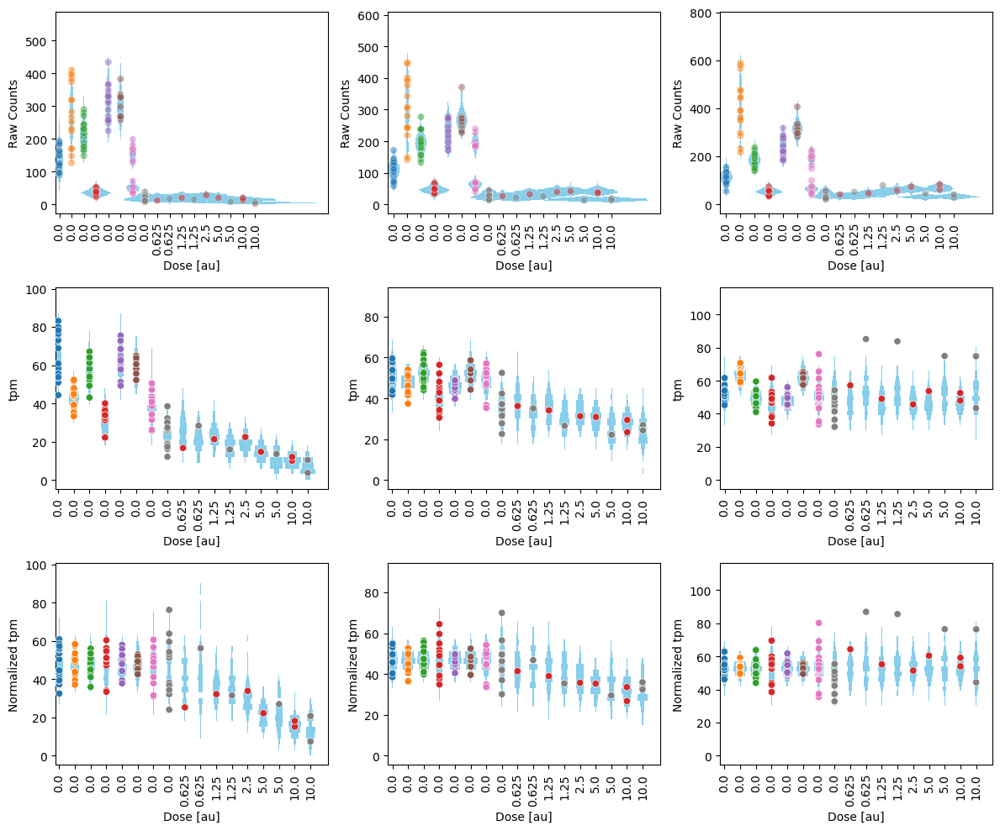

In [69]:
fig, ax = plt.subplots(3,3, figsize=(12,10))

for pl,i in enumerate(gene_select):

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=True, use_regularized_tpm=True)

    for clv in df_sim_data['cl'].drop_duplicates():
        hist, bins=np.histogram(df_sim_data[df_sim_data['cl']==clv]['raw_counts'], bins=np.arange(0,np.round(1.3*np.max(df_combined['data'])),3))
        my_hist_plot(ax[0,pl], hist, bins, scale=20, shift=clv, log_scale=False, color='skyblue', label='Histogram of MAP estimates')

    sns.scatterplot(ax=ax[0,pl], data=df_combined, x='cl',y='data',hue='plate_index', palette=sns.color_palette("tab10")[:8], legend=False, zorder=10, alpha=0.5)
    ax[0,pl].set_xticks(np.arange(len(df_label)),labels=df_label['dose'],rotation=90)
    ax[0,pl].set_ylabel('Raw Counts')
    ax[0,pl].set_xlabel('Dose [au]')

for pl,i in enumerate(gene_select):

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=True, use_regularized_tpm=True)

    for clv in df_sim_data['cl'].drop_duplicates():
        hist, bins=np.histogram(df_sim_data[df_sim_data['cl']==clv]['tpm'], bins=np.arange(0,np.round(1.3*np.max(df_combined['tpm_regularized'])),3))
        my_hist_plot(ax[1,pl], hist, bins, scale=3, shift=clv, log_scale=False, color='skyblue', label='Histogram of MAP estimates')

    sns.scatterplot(ax=ax[1,pl], data=df_combined, x='cl',y='tpm',hue='plate_index', palette=sns.color_palette("tab10")[:8], legend=False, zorder=10)
    ax[1,pl].set_xticks(np.arange(len(df_label)),labels=df_label['dose'],rotation=90)
    ax[1,pl].set_xlabel('Dose [au]')
    
for pl,i in enumerate(gene_select):

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=True, use_regularized_tpm=True)

    for clv in df_sim_data['cl'].drop_duplicates():
        hist, bins=np.histogram(df_sim_data[df_sim_data['cl']==clv]['tpm_regularized'], bins=np.arange(0,np.round(1.3*np.max(df_combined['tpm_regularized'])),3))
        my_hist_plot(ax[2,pl], hist, bins, scale=3, shift=clv, log_scale=False, color='skyblue', label='Histogram of MAP estimates')

    sns.scatterplot(ax=ax[2,pl], data=df_combined, x='cl',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], legend=False, zorder=10)
    ax[2,pl].set_xticks(np.arange(len(df_label)),labels=df_label['dose'],rotation=90)
    ax[2,pl].set_ylabel('Normalized tpm')
    ax[2,pl].set_xlabel('Dose [au]')

plt.tight_layout()
plt.savefig('fig_exp_raw_tpm_reg_v1.png',dpi=600)

In [70]:
np.arange(0,np.round(1.3*np.max(df_combined['tpm_regularized'])),2)

array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.,
        22.,  24.,  26.,  28.,  30.,  32.,  34.,  36.,  38.,  40.,  42.,
        44.,  46.,  48.,  50.,  52.,  54.,  56.,  58.,  60.,  62.,  64.,
        66.,  68.,  70.,  72.,  74.,  76.,  78.,  80.,  82.,  84.,  86.,
        88.,  90.,  92.,  94.,  96.,  98., 100., 102., 104., 106., 108.,
       110., 112.])

In [71]:
def mk_kd_ic50_contour_plot(ax, ground_truth, res, gene, make_legend=True, manual_locations=False, make_xlabel=True, make_ylabel=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    
    # Global map estimate
    kd_i,ic50_i=res[i]['analysis']['MAP estimate'][-2:]
    ax.plot([kd_i],[ic50_i],'o',label='MAP estimate',color='lime', markersize=8)
    
    # marginalized over phi and tpm
    kd_i,ic50_i=res[i]['analysis']['kd_ic50']['mapEstimate']
    ax.plot([kd_i],[ic50_i],'*',label='MAP estimate\nmarginalized',color='deepskyblue', markersize=10)

    if len(ground_truth)>0:
        tpm_i,phi_i,kd_i,ic50_i=ground_truth
        ax.plot([kd_i],[ic50_i],'^',label='Ground truth',color='cyan', markersize=8)

    if make_xlabel:    
        ax.set_xlabel('kd')
    if make_ylabel:
        ax.set_ylabel('ic50')
    

    hist=res[i]['analysis']['kd_ic50']['hist']
    kd_bins=res[i]['analysis']['kd_ic50']['bins'][0]
    ic50_bins=res[i]['analysis']['kd_ic50']['bins'][1]
    contours=res[i]['analysis']['kd_ic50']['contours']
    cuts=[0.99,0.95,0.5]
    X,Y=np.meshgrid(0.5*(kd_bins[1:]+kd_bins[:-1]),0.5*(ic50_bins[1:]+ic50_bins[:-1]))

    print(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1])
#    ax.imshow(hist.T, origin='lower',extent=(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1]),aspect=1/17,cmap='viridis')
    ax.imshow(np.max(hist)-hist.T, origin='lower',extent=(kd_bins[0],kd_bins[-1],ic50_bins[0],ic50_bins[-1]),cmap='hot',aspect='auto')

#    CS=ax.contour(X,Y,hist.T,contours,colors=('darkgrey','gray','dimgray'))
    CS=ax.contour(X,Y,hist.T,contours,colors=('black','black','black'))

    if manual_locations!=False:
        ax.clabel(CS, inline=True, fontsize=10, fmt=dict(zip(contours,[f'{100*c}%' for c in cuts])), manual=manual_locations)
    else:
        ax.clabel(CS, inline=True, fontsize=10, fmt=dict(zip(contours,[f'{100*c}%' for c in cuts])))
        

    if make_legend:
        ax.legend(frameon=False)

In [72]:
def mk_rfd_hist_plot(ax, ground_truth, res, gene, dose, make_legend=True, make_xlabel=True, make_ylabel=True):
    i=np.where(df_raw_select.index==gene)[0][0]
    sel='rfd_'+str(dose)
    
    hist_rfd=res[i]['analysis']['rfd'][sel]['hist']
    bins_rfd=res[i]['analysis']['rfd'][sel]['bins'][0]

    ax.plot(hist_rfd/(bins_rfd[1]-bins_rfd[0]), 0.5*(bins_rfd[1:]+bins_rfd[:-1]))
    
    map_value_rfd=res[i]['analysis']['rfd'][sel]['mapEstimate']
    rfd_error=[map_value_rfd-res[i]['analysis']['rfd'][sel]['credibilityIntervals'][0][0],res[i]['analysis']['rfd'][sel]['credibilityIntervals'][0][1]-map_value_rfd]
    ax.errorbar([0.5],[map_value_rfd],yerr=rfd_error,capsize=1, fmt='o',color='purple')
    if make_xlabel:
        ax.set_xlabel('PDF over\nMCMC samples')
    if make_ylabel:
        ax.set_ylabel('Knockdown at dose='+str(dose))
    ax.set_ylim(0,1.01)
    ax.set_xlim(-0.1,17)

legend
0.0 1.0 0.0 15.0
0.0 1.0 0.0 15.0
0.0 1.0 0.0 15.0


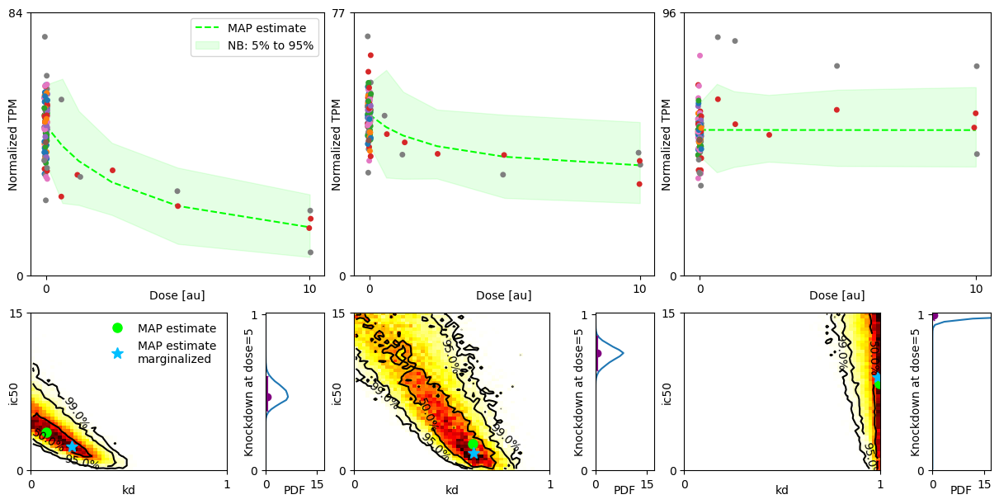

In [73]:
ax = plt.figure(layout="constrained", figsize=(12,6)).subplot_mosaic(
    """
    AABBCC
    DEFGHI
    """,
    # set the height ratios between the rows
    height_ratios=[1, 0.6],
    # set the width ratios between the columns
    width_ratios=[1, 0.3,1,0.3,1,0.3],
)

for i, p1,p2,p3 in zip(gene_select,['A','B','C'],['D','F','H'],['E','G','I']):

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True)

    npa_dose_response=np.array(df_label[['dose','tpm','LB','UB']])
    ax[p1].plot(npa_dose_response[:,0],npa_dose_response[:,1],'--',color='lime',label='MAP estimate')
    ax[p1].fill_between(npa_dose_response[:,0],npa_dose_response[:,2],npa_dose_response[:,3],color='lime',label='NB: 5% to 95%',alpha=0.1)

    sns.stripplot(ax=ax[p1], data=df_combined, x='dose',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], native_scale=True, legend=False, dodge=False, jitter=0.1)

    if i==gene_select[0]:
        print('legend')
        ax[p1].legend()
    ax[p1].set_ylim(0, 1.1*np.max(df_combined['tpm_regularized']))
    ax[p1].set_ylabel('Normalized TPM')
    ax[p1].set_xlabel('Dose [au]')
    
    ax[p1].yaxis.labelpad = -10
    ax[p1].xaxis.labelpad = -5
    ax[p1].set_xticks([0,10])
    ax[p1].set_yticks([0,np.round(1.1*np.max(df_combined['tpm_regularized']))])

    mk_kd_ic50_contour_plot(ax[p2], [], res_all, df_raw_select.index[i], make_legend=(i==gene_select[0]), manual_locations=False, make_xlabel=True, make_ylabel=True)
    ax[p2].yaxis.labelpad = -10
    ax[p2].xaxis.labelpad = -5
    ax[p2].set_xticks([0,1])
    ax[p2].set_yticks([0,15])

    mk_rfd_hist_plot(ax[p3], [], res_all, df_raw_select.index[i], dose=5, make_legend=(i==gene_select[0]), make_xlabel=True, make_ylabel=True)
    ax[p3].yaxis.labelpad = -5
    ax[p3].xaxis.labelpad = -5
    ax[p3].set_xticks([0,15])
    ax[p3].set_yticks([0,1])
    ax[p3].set_xlabel('PDF')
plt.savefig('fig_exp_summary_v1.png',dpi=600)
plt.show()

In [74]:
# Plot all strongly dose-responsive genes ...

In [75]:
res_all[0]['analysis']['rfd']['rfd_5']['bins'][0][38]

0.76

In [76]:
np.sum(res_all[0]['analysis']['rfd']['rfd_5']['hist'][38:])

1.0

In [77]:
p_val_5_list=[np.sum(r['analysis']['rfd']['rfd_5']['hist'][38:]) for r in res_all]

In [78]:
# use p-value<0.01 in order to pick which results to display
# use kd at dose=5 in order to sort results
#p_val_5_list=np.array([np.sum(r['analysis']['rfd']['rfd_5']['hist'][38:]) for r in res_all])
p_val_5_list=np.array([r['analysis']['rfd']['rfd_5']['estimated_p_val'] for r in res_all])
rfd5_list=np.array([r['analysis']['rfd']['rfd_5']['mapEstimate'][0] for r in res_all])

small_p_iloc=np.where(p_val_5_list<0.01)[0]
ord=np.argsort(rfd5_list[small_p_iloc])
small_p_iloc_sorted=small_p_iloc[ord]

print('number of genes with p-value <0.01:',len(small_p_iloc_sorted))

number of genes with p-value <0.01: 203


In [79]:
8*13

104

In [80]:
med_p_iloc=np.where((p_val_5_list>0.01) & (p_val_5_list<0.99))[0]
print('number medium p-value=',len(med_p_iloc))
med_p_iloc=np.random.choice(med_p_iloc,104)
ord=np.argsort(rfd5_list[med_p_iloc])
med_p_iloc_sorted=med_p_iloc[ord]
print('number sampled medium p-value=',len(med_p_iloc_sorted))

large_p_iloc=np.where(p_val_5_list>0.99)[0]
print('number large p-value=',len(large_p_iloc))
large_p_iloc=np.random.choice(large_p_iloc,104)
ord=np.argsort(rfd5_list[large_p_iloc])
large_p_iloc_sorted=large_p_iloc[ord]
print('number sampled large p-value=',len(large_p_iloc_sorted))

number medium p-value= 3573
number sampled medium p-value= 104
number large p-value= 4229
number sampled large p-value= 104


In [81]:
np.where(small_p_iloc_sorted==6827)

(array([46]),)

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
0 1
1 1
2 1
3 1
4 1
5 1
6 1
7 1
0 2
1 2
2 2
3 2
4 2
5 2
6 2
7 2
0 3
1 3
2 3
3 3
4 3
5 3
6 3
7 3
0 4
1 4
2 4
3 4
4 4
5 4
6 4
7 4
0 5
1 5
2 5
3 5
4 5
5 5
6 5
7 5
0 6
1 6
2 6
3 6
4 6
5 6
6 6
7 6
0 7
1 7
2 7
3 7
4 7
5 7
6 7
7 7
0 8
1 8
2 8
3 8
4 8
5 8
6 8
7 8
0 9
1 9
2 9
3 9
4 9
5 9
6 9
7 9
0 10
1 10
2 10
3 10
4 10
5 10
6 10
7 10
0 11
1 11
2 11
3 11
4 11
5 11
6 11
7 11
0 12
1 12
2 12
3 12
4 12
5 12
6 12
7 12


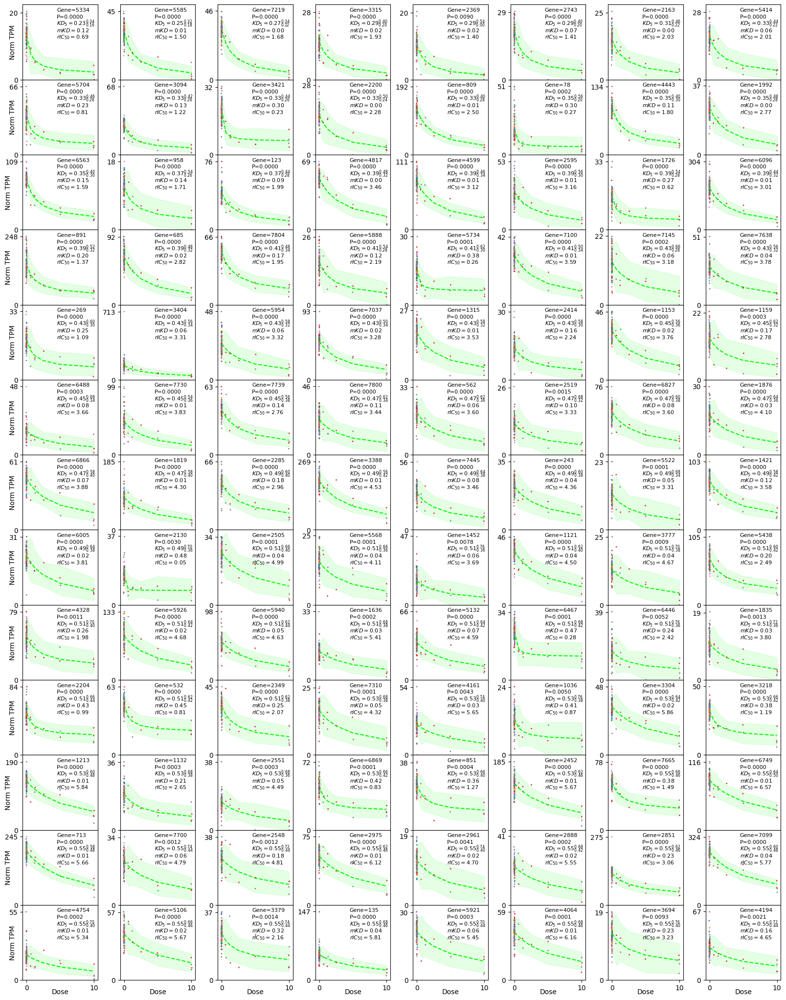

In [82]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True)

for j,i  in enumerate(small_p_iloc_sorted[:13*8]):
    y=j//8
    x=j-8*y
    
    print(x,y)

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True)

    npa_dose_response=np.array(df_label[['dose','tpm','LB','UB']])
    ax[y,x].plot(npa_dose_response[:,0],npa_dose_response[:,1],'--',color='lime',label='MAP estimate')
    ax[y,x].fill_between(npa_dose_response[:,0],npa_dose_response[:,2],npa_dose_response[:,3],color='lime',label='NB: 5% to 95%',alpha=0.1)

    sns.stripplot(ax=ax[y,x], data=df_combined, x='dose',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], 
                  native_scale=True, legend=False, dodge=False, jitter=0.1,size=2)

    max_y=np.max(df_combined['tpm_regularized'])

    ax[y,x].set_ylim(0, 1.1*max_y)
    if x==0:
        ax[y,x].set_ylabel('Norm TPM')
    else:
        ax[y,x].set_ylabel('')
        
    if y==12:
        ax[y,x].set_xlabel('Dose')
    else:
        ax[y,x].set_xlabel('')

    ax[y,x].yaxis.labelpad = -10
    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,10])
    ax[y,x].set_yticks([0,np.round(1.*max_y)])
    
    # print the gene name
    ax[y,x].text(4.5,1.*max_y,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(4.5,0.9*max_y,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(4.5,0.8*max_y,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.7*max_y,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.6*max_y,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_1.png',dpi=600)
plt.show()

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
0 1
1 1
2 1
3 1
4 1
5 1
6 1
7 1
0 2
1 2
2 2
3 2
4 2
5 2
6 2
7 2
0 3
1 3
2 3
3 3
4 3
5 3
6 3
7 3
0 4
1 4
2 4
3 4
4 4
5 4
6 4
7 4
0 5
1 5
2 5
3 5
4 5
5 5
6 5
7 5
0 6
1 6
2 6
3 6
4 6
5 6
6 6
7 6
0 7
1 7
2 7
3 7
4 7
5 7
6 7
7 7
0 8
1 8
2 8
3 8
4 8
5 8
6 8
7 8
0 9
1 9
2 9
3 9
4 9
5 9
6 9
7 9
0 10
1 10
2 10
3 10
4 10
5 10
6 10
7 10
0 11
1 11
2 11
3 11
4 11
5 11
6 11
7 11
0 12
1 12
2 12


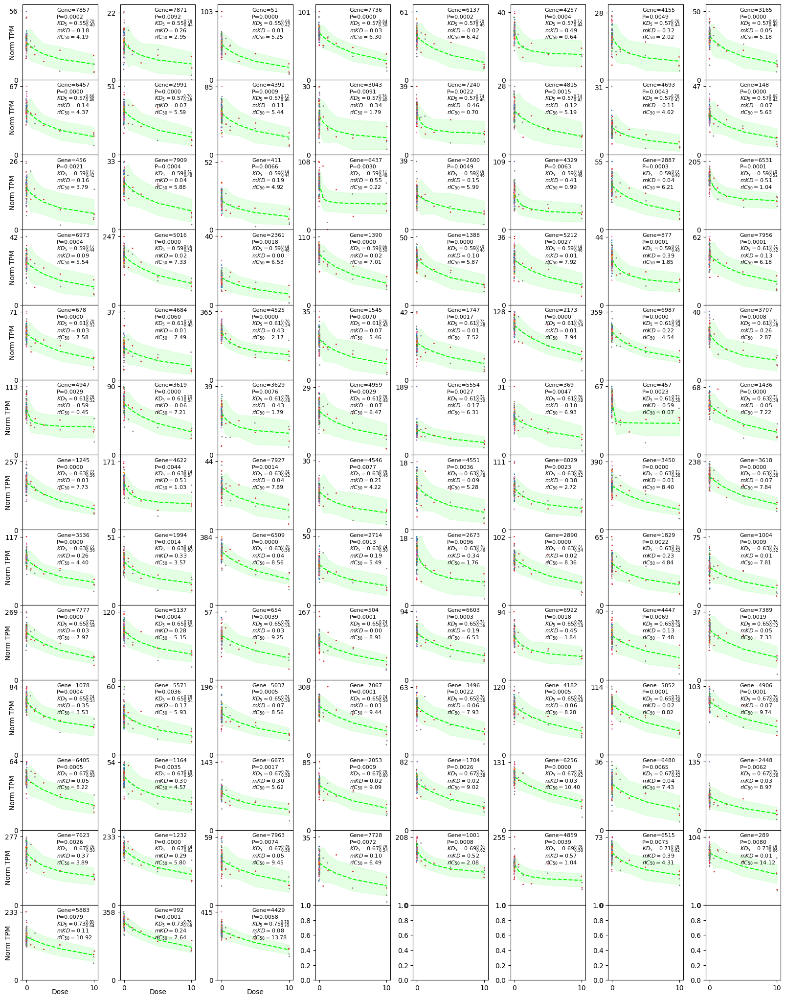

In [83]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True)

for j,i  in enumerate(small_p_iloc_sorted[13*8:]):
    y=j//8
    x=j-8*y
    
    print(x,y)

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True)

    npa_dose_response=np.array(df_label[['dose','tpm','LB','UB']])
    ax[y,x].plot(npa_dose_response[:,0],npa_dose_response[:,1],'--',color='lime',label='MAP estimate')
    ax[y,x].fill_between(npa_dose_response[:,0],npa_dose_response[:,2],npa_dose_response[:,3],color='lime',label='NB: 5% to 95%',alpha=0.1)

    sns.stripplot(ax=ax[y,x], data=df_combined, x='dose',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], 
                  native_scale=True, legend=False, dodge=False, jitter=0.1,size=2)

    max_y=np.max(df_combined['tpm_regularized'])

    ax[y,x].set_ylim(0, 1.1*max_y)
    if x==0:
        ax[y,x].set_ylabel('Norm TPM')
    else:
        ax[y,x].set_ylabel('')
        
    if y==12:
        ax[y,x].set_xlabel('Dose')
    else:
        ax[y,x].set_xlabel('')

    ax[y,x].yaxis.labelpad = -10
    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,10])
    ax[y,x].set_yticks([0,np.round(1.*max_y)])
    
    # print the gene name
    ax[y,x].text(4.5,1.*max_y,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(4.5,0.9*max_y,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(4.5,0.8*max_y,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.7*max_y,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.6*max_y,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_2.png',dpi=600)
plt.show()

0 0
0.0 1.0 0.0 15.0
1 0
0.0 1.0 0.0 15.0
2 0
0.0 1.0 0.0 15.0
3 0
0.0 1.0 0.0 15.0
4 0
0.0 1.0 0.0 15.0
5 0
0.0 1.0 0.0 15.0
6 0
0.0 1.0 0.0 15.0
7 0
0.0 1.0 0.0 15.0
0 1
0.0 1.0 0.0 15.0
1 1
0.0 1.0 0.0 15.0
2 1
0.0 1.0 0.0 15.0
3 1
0.0 1.0 0.0 15.0
4 1
0.0 1.0 0.0 15.0
5 1
0.0 1.0 0.0 15.0
6 1
0.0 1.0 0.0 15.0
7 1
0.0 1.0 0.0 15.0
0 2
0.0 1.0 0.0 15.0
1 2
0.0 1.0 0.0 15.0
2 2
0.0 1.0 0.0 15.0
3 2
0.0 1.0 0.0 15.0
4 2
0.0 1.0 0.0 15.0
5 2
0.0 1.0 0.0 15.0
6 2
0.0 1.0 0.0 15.0
7 2
0.0 1.0 0.0 15.0
0 3
0.0 1.0 0.0 15.0
1 3
0.0 1.0 0.0 15.0
2 3
0.0 1.0 0.0 15.0
3 3
0.0 1.0 0.0 15.0
4 3
0.0 1.0 0.0 15.0
5 3
0.0 1.0 0.0 15.0
6 3
0.0 1.0 0.0 15.0
7 3
0.0 1.0 0.0 15.0
0 4
0.0 1.0 0.0 15.0
1 4
0.0 1.0 0.0 15.0
2 4
0.0 1.0 0.0 15.0
3 4
0.0 1.0 0.0 15.0
4 4
0.0 1.0 0.0 15.0
5 4
0.0 1.0 0.0 15.0
6 4
0.0 1.0 0.0 15.0
7 4
0.0 1.0 0.0 15.0
0 5
0.0 1.0 0.0 15.0
1 5
0.0 1.0 0.0 15.0
2 5
0.0 1.0 0.0 15.0
3 5
0.0 1.0 0.0 15.0
4 5
0.0 1.0 0.0 15.0
5 5
0.0 1.0 0.0 15.0
6 5
0.0 1.0 0.0 15.0
7 5
0.0 1.0 0

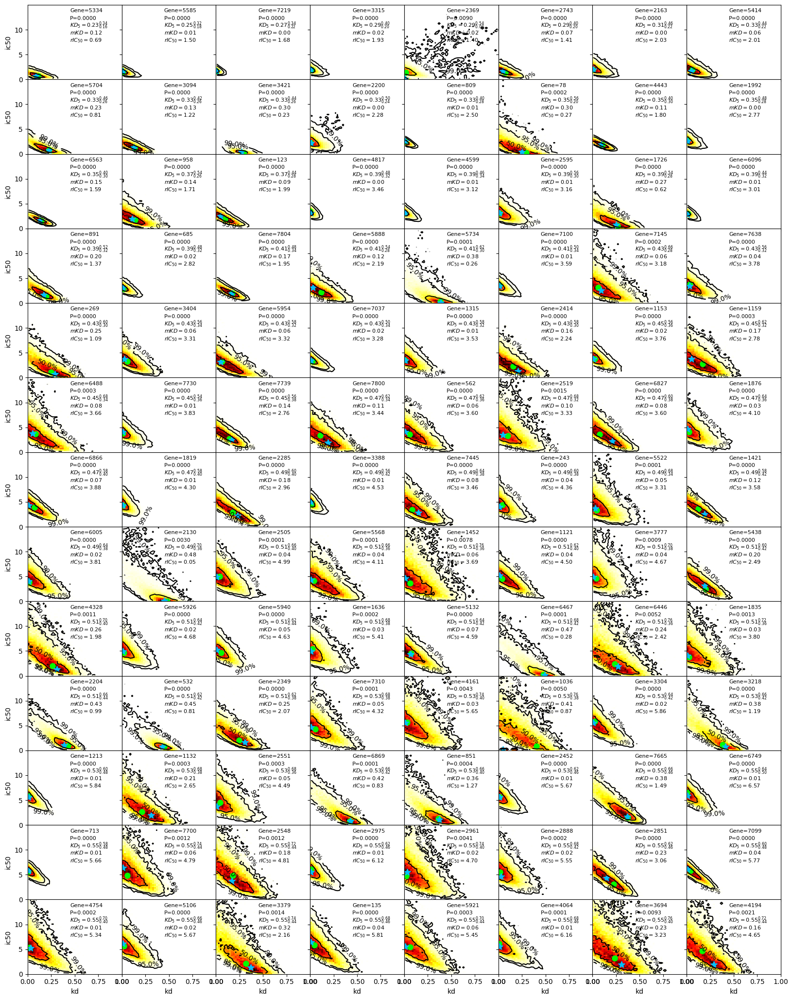

In [84]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True, sharey=True)

for j,i  in enumerate(small_p_iloc_sorted[:13*8]):
    y=j//8
    x=j-8*y
    
    print(x,y)
    
    mk_kd_ic50_contour_plot(ax[y,x], [], res_all, df_raw_select.index[i], make_legend=False, manual_locations=False, make_xlabel=(y==12), make_ylabel=(x==0))

#    ax[y,x].yaxis.labelpad = -10
#    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,0.25,0.5,0.75,1])
    ax[y,x].set_yticks([0,5,10])

    # print the gene name
    ax[y,x].text(0.45,13.5,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(0.45,12,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(0.45,10.5,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,9.,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,7.5,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_1B.png',dpi=600)
plt.show()

0 0
0.0 1.0 0.0 15.0
1 0
0.0 1.0 0.0 15.0
2 0
0.0 1.0 0.0 15.0
3 0
0.0 1.0 0.0 15.0
4 0
0.0 1.0 0.0 15.0
5 0
0.0 1.0 0.0 15.0
6 0
0.0 1.0 0.0 15.0
7 0
0.0 1.0 0.0 15.0
0 1
0.0 1.0 0.0 15.0
1 1
0.0 1.0 0.0 15.0
2 1
0.0 1.0 0.0 15.0
3 1
0.0 1.0 0.0 15.0
4 1
0.0 1.0 0.0 15.0
5 1
0.0 1.0 0.0 15.0
6 1
0.0 1.0 0.0 15.0
7 1
0.0 1.0 0.0 15.0
0 2
0.0 1.0 0.0 15.0
1 2
0.0 1.0 0.0 15.0
2 2
0.0 1.0 0.0 15.0
3 2
0.0 1.0 0.0 15.0
4 2
0.0 1.0 0.0 15.0
5 2
0.0 1.0 0.0 15.0
6 2
0.0 1.0 0.0 15.0
7 2
0.0 1.0 0.0 15.0
0 3
0.0 1.0 0.0 15.0
1 3
0.0 1.0 0.0 15.0
2 3
0.0 1.0 0.0 15.0
3 3
0.0 1.0 0.0 15.0
4 3
0.0 1.0 0.0 15.0
5 3
0.0 1.0 0.0 15.0
6 3
0.0 1.0 0.0 15.0
7 3
0.0 1.0 0.0 15.0
0 4
0.0 1.0 0.0 15.0
1 4
0.0 1.0 0.0 15.0
2 4
0.0 1.0 0.0 15.0
3 4
0.0 1.0 0.0 15.0
4 4
0.0 1.0 0.0 15.0
5 4
0.0 1.0 0.0 15.0
6 4
0.0 1.0 0.0 15.0
7 4
0.0 1.0 0.0 15.0
0 5
0.0 1.0 0.0 15.0
1 5
0.0 1.0 0.0 15.0
2 5
0.0 1.0 0.0 15.0
3 5
0.0 1.0 0.0 15.0
4 5
0.0 1.0 0.0 15.0
5 5
0.0 1.0 0.0 15.0
6 5
0.0 1.0 0.0 15.0
7 5
0.0 1.0 0

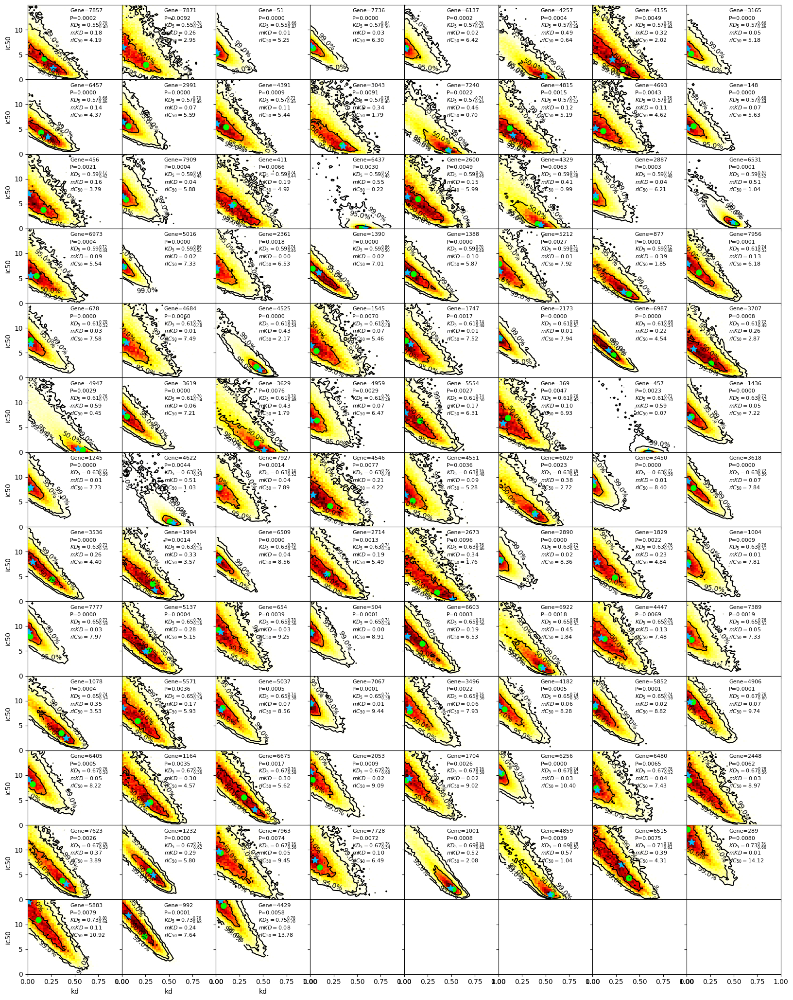

In [85]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True, sharey=True)

for j,i  in enumerate(small_p_iloc_sorted[13*8:]):
    y=j//8
    x=j-8*y
    
    print(x,y)
    
    mk_kd_ic50_contour_plot(ax[y,x], [], res_all, df_raw_select.index[i], make_legend=False, manual_locations=False, make_xlabel=(y==12), make_ylabel=(x==0))

#    ax[y,x].yaxis.labelpad = -10
#    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,0.25,0.5,0.75,1])
    ax[y,x].set_yticks([0,5,10])

    # print the gene name
    ax[y,x].text(0.45,13.5,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(0.45,12,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(0.45,10.5,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,9.,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,7.5,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_2B.png',dpi=600)
plt.show()

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
0 1
1 1
2 1
3 1
4 1
5 1
6 1
7 1
0 2
1 2
2 2
3 2
4 2
5 2
6 2
7 2
0 3
1 3
2 3
3 3
4 3
5 3
6 3
7 3
0 4
1 4
2 4
3 4
4 4
5 4
6 4
7 4
0 5
1 5
2 5
3 5
4 5
5 5
6 5
7 5
0 6
1 6
2 6
3 6
4 6
5 6
6 6
7 6
0 7
1 7
2 7
3 7
4 7
5 7
6 7
7 7
0 8
1 8
2 8
3 8
4 8
5 8
6 8
7 8
0 9
1 9
2 9
3 9
4 9
5 9
6 9
7 9
0 10
1 10
2 10
3 10
4 10
5 10
6 10
7 10
0 11
1 11
2 11
3 11
4 11
5 11
6 11
7 11
0 12
1 12
2 12
3 12
4 12
5 12
6 12
7 12


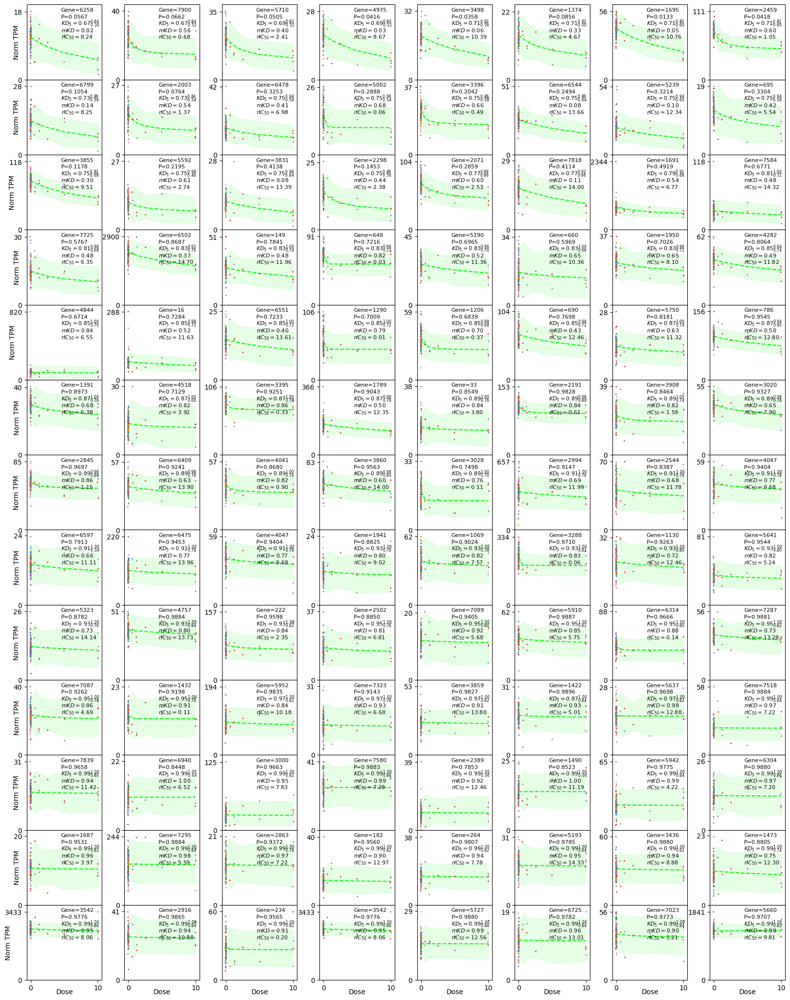

In [86]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True)

for j,i  in enumerate(med_p_iloc_sorted[:13*8]):
    y=j//8
    x=j-8*y
    
    print(x,y)

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True)

    npa_dose_response=np.array(df_label[['dose','tpm','LB','UB']])
    ax[y,x].plot(npa_dose_response[:,0],npa_dose_response[:,1],'--',color='lime',label='MAP estimate')
    ax[y,x].fill_between(npa_dose_response[:,0],npa_dose_response[:,2],npa_dose_response[:,3],color='lime',label='NB: 5% to 95%',alpha=0.1)

    sns.stripplot(ax=ax[y,x], data=df_combined, x='dose',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], 
                  native_scale=True, legend=False, dodge=False, jitter=0.1,size=2)

    max_y=np.max(df_combined['tpm_regularized'])

    ax[y,x].set_ylim(0, 1.1*max_y)
    if x==0:
        ax[y,x].set_ylabel('Norm TPM')
    else:
        ax[y,x].set_ylabel('')
        
    if y==12:
        ax[y,x].set_xlabel('Dose')
    else:
        ax[y,x].set_xlabel('')

    ax[y,x].yaxis.labelpad = -10
    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,10])
    ax[y,x].set_yticks([0,np.round(1.*max_y)])
    
    # print the gene name
    ax[y,x].text(4.5,1.*max_y,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(4.5,0.9*max_y,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(4.5,0.8*max_y,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.7*max_y,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.6*max_y,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_3.png',dpi=600)
plt.show()

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
0 1
1 1
2 1
3 1
4 1
5 1
6 1
7 1
0 2
1 2
2 2
3 2
4 2
5 2
6 2
7 2
0 3
1 3
2 3
3 3
4 3
5 3
6 3
7 3
0 4
1 4
2 4
3 4
4 4
5 4
6 4
7 4
0 5
1 5
2 5
3 5
4 5
5 5
6 5
7 5
0 6
1 6
2 6
3 6
4 6
5 6
6 6
7 6
0 7
1 7
2 7
3 7
4 7
5 7
6 7
7 7
0 8
1 8
2 8
3 8
4 8
5 8
6 8
7 8
0 9
1 9
2 9
3 9
4 9
5 9
6 9
7 9
0 10
1 10
2 10
3 10
4 10
5 10
6 10
7 10
0 11
1 11
2 11
3 11
4 11
5 11
6 11
7 11
0 12
1 12
2 12
3 12
4 12
5 12
6 12
7 12


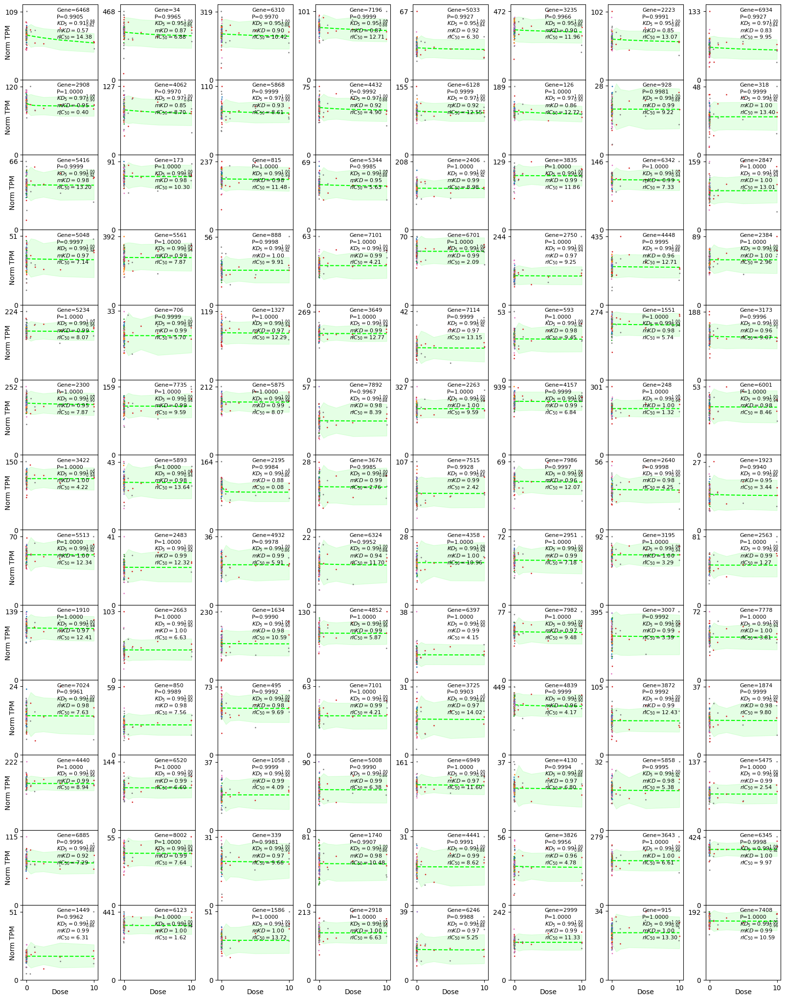

In [87]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True)

for j,i  in enumerate(large_p_iloc_sorted[:13*8]):
    y=j//8
    x=j-8*y
    
    print(x,y)

    map_parameters=get_map_parameters(res_all[i]['analysis']['MAP estimate'])
    df_combined=combine_data(df_meta_select, df_raw_select, i, map_parameters)

    df_sim_data=simulate_map_distribution(map_parameters, df_combined)
    df_label=extract_NB_distributions(map_parameters, df_sim_data, use_cl=False, use_regularized_tpm=True)

    npa_dose_response=np.array(df_label[['dose','tpm','LB','UB']])
    ax[y,x].plot(npa_dose_response[:,0],npa_dose_response[:,1],'--',color='lime',label='MAP estimate')
    ax[y,x].fill_between(npa_dose_response[:,0],npa_dose_response[:,2],npa_dose_response[:,3],color='lime',label='NB: 5% to 95%',alpha=0.1)

    sns.stripplot(ax=ax[y,x], data=df_combined, x='dose',y='tpm_regularized',hue='plate_index', palette=sns.color_palette("tab10")[:8], 
                  native_scale=True, legend=False, dodge=False, jitter=0.1,size=2)

    max_y=np.max(df_combined['tpm_regularized'])

    ax[y,x].set_ylim(0, 1.1*max_y)
    if x==0:
        ax[y,x].set_ylabel('Norm TPM')
    else:
        ax[y,x].set_ylabel('')
        
    if y==12:
        ax[y,x].set_xlabel('Dose')
    else:
        ax[y,x].set_xlabel('')

    ax[y,x].yaxis.labelpad = -10
    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,10])
    ax[y,x].set_yticks([0,np.round(1.*max_y)])
    
    # print the gene name
    ax[y,x].text(4.5,1.*max_y,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(4.5,0.9*max_y,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(4.5,0.8*max_y,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.7*max_y,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(4.5,0.6*max_y,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.3)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_4.png',dpi=600)
plt.show()

0 0
0.0 1.0 0.0 15.0
1 0
0.0 1.0 0.0 15.0
2 0
0.0 1.0 0.0 15.0
3 0
0.0 1.0 0.0 15.0
4 0
0.0 1.0 0.0 15.0
5 0
0.0 1.0 0.0 15.0
6 0
0.0 1.0 0.0 15.0
7 0
0.0 1.0 0.0 15.0
0 1
0.0 1.0 0.0 15.0
1 1
0.0 1.0 0.0 15.0
2 1
0.0 1.0 0.0 15.0
3 1
0.0 1.0 0.0 15.0
4 1
0.0 1.0 0.0 15.0
5 1
0.0 1.0 0.0 15.0
6 1
0.0 1.0 0.0 15.0
7 1
0.0 1.0 0.0 15.0
0 2
0.0 1.0 0.0 15.0
1 2
0.0 1.0 0.0 15.0
2 2
0.0 1.0 0.0 15.0
3 2
0.0 1.0 0.0 15.0
4 2
0.0 1.0 0.0 15.0
5 2
0.0 1.0 0.0 15.0
6 2
0.0 1.0 0.0 15.0
7 2
0.0 1.0 0.0 15.0
0 3
0.0 1.0 0.0 15.0
1 3
0.0 1.0 0.0 15.0
2 3
0.0 1.0 0.0 15.0
3 3
0.0 1.0 0.0 15.0
4 3
0.0 1.0 0.0 15.0
5 3
0.0 1.0 0.0 15.0
6 3
0.0 1.0 0.0 15.0
7 3
0.0 1.0 0.0 15.0
0 4
0.0 1.0 0.0 15.0
1 4
0.0 1.0 0.0 15.0
2 4
0.0 1.0 0.0 15.0
3 4
0.0 1.0 0.0 15.0
4 4
0.0 1.0 0.0 15.0
5 4
0.0 1.0 0.0 15.0
6 4
0.0 1.0 0.0 15.0
7 4
0.0 1.0 0.0 15.0
0 5
0.0 1.0 0.0 15.0
1 5
0.0 1.0 0.0 15.0
2 5
0.0 1.0 0.0 15.0
3 5
0.0 1.0 0.0 15.0
4 5
0.0 1.0 0.0 15.0
5 5
0.0 1.0 0.0 15.0
6 5
0.0 1.0 0.0 15.0
7 5
0.0 1.0 0

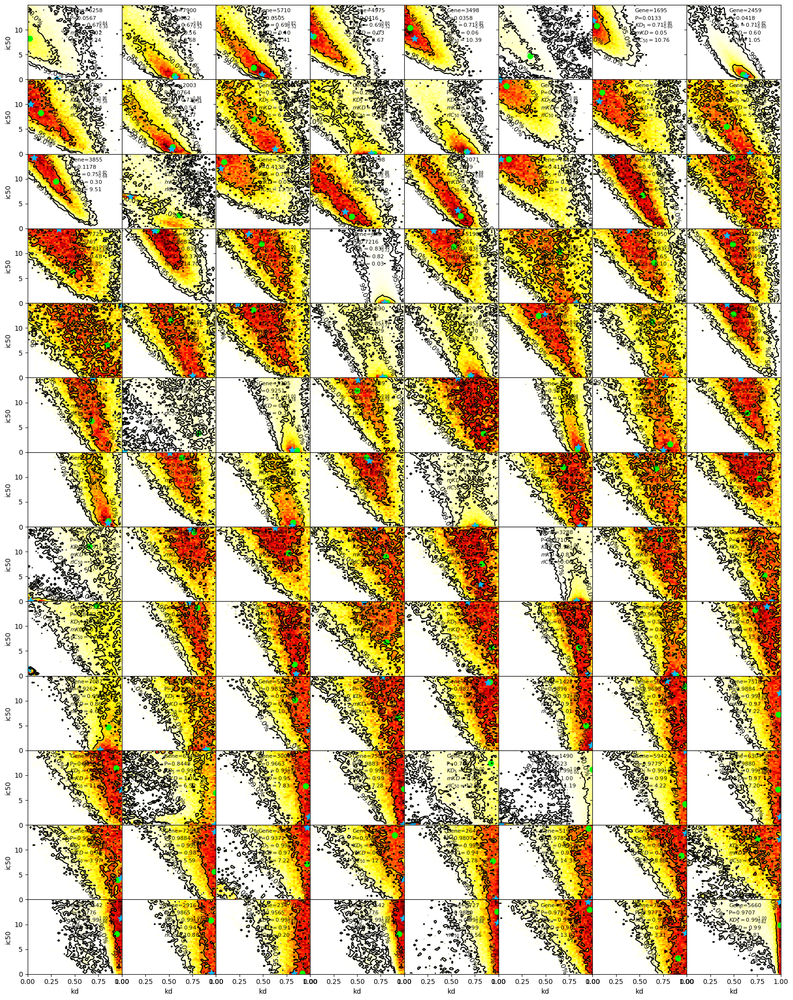

In [88]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True, sharey=True)

for j,i  in enumerate(med_p_iloc_sorted):
    y=j//8
    x=j-8*y
    
    print(x,y)
    
    mk_kd_ic50_contour_plot(ax[y,x], [], res_all, df_raw_select.index[i], make_legend=False, manual_locations=False, make_xlabel=(y==12), make_ylabel=(x==0))

#    ax[y,x].yaxis.labelpad = -10
#    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,0.25,0.5,0.75,1])
    ax[y,x].set_yticks([0,5,10])

    # print the gene name
    ax[y,x].text(0.45,13.5,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(0.45,12,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(0.45,10.5,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,9.,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.45,7.5,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_3B.png',dpi=600)
plt.show()

0 0
0.0 1.0 0.0 15.0
1 0
0.0 1.0 0.0 15.0
2 0
0.0 1.0 0.0 15.0
3 0
0.0 1.0 0.0 15.0
4 0
0.0 1.0 0.0 15.0
5 0
0.0 1.0 0.0 15.0
6 0
0.0 1.0 0.0 15.0
7 0
0.0 1.0 0.0 15.0
0 1
0.0 1.0 0.0 15.0
1 1
0.0 1.0 0.0 15.0
2 1
0.0 1.0 0.0 15.0
3 1
0.0 1.0 0.0 15.0
4 1
0.0 1.0 0.0 15.0
5 1
0.0 1.0 0.0 15.0
6 1
0.0 1.0 0.0 15.0
7 1
0.0 1.0 0.0 15.0
0 2
0.0 1.0 0.0 15.0
1 2
0.0 1.0 0.0 15.0
2 2
0.0 1.0 0.0 15.0
3 2
0.0 1.0 0.0 15.0
4 2
0.0 1.0 0.0 15.0
5 2
0.0 1.0 0.0 15.0
6 2
0.0 1.0 0.0 15.0
7 2
0.0 1.0 0.0 15.0
0 3
0.0 1.0 0.0 15.0
1 3
0.0 1.0 0.0 15.0
2 3
0.0 1.0 0.0 15.0
3 3
0.0 1.0 0.0 15.0
4 3
0.0 1.0 0.0 15.0
5 3
0.0 1.0 0.0 15.0
6 3
0.0 1.0 0.0 15.0
7 3
0.0 1.0 0.0 15.0
0 4
0.0 1.0 0.0 15.0
1 4
0.0 1.0 0.0 15.0
2 4
0.0 1.0 0.0 15.0
3 4
0.0 1.0 0.0 15.0
4 4
0.0 1.0 0.0 15.0
5 4
0.0 1.0 0.0 15.0
6 4
0.0 1.0 0.0 15.0
7 4
0.0 1.0 0.0 15.0
0 5
0.0 1.0 0.0 15.0
1 5
0.0 1.0 0.0 15.0
2 5
0.0 1.0 0.0 15.0
3 5
0.0 1.0 0.0 15.0
4 5
0.0 1.0 0.0 15.0
5 5
0.0 1.0 0.0 15.0
6 5
0.0 1.0 0.0 15.0
7 5
0.0 1.0 0

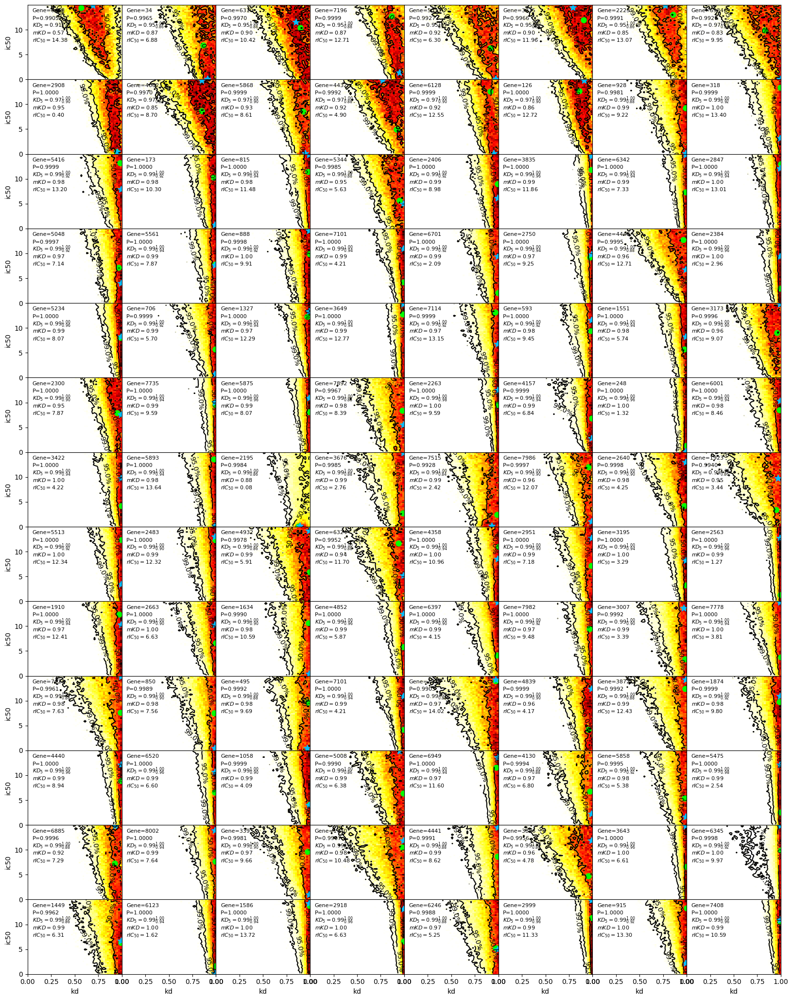

In [89]:
n_plate=8
fig, ax = plt.subplots(13,8, figsize=(20,25.88), sharex=True, sharey=True)

for j,i  in enumerate(large_p_iloc_sorted):
    y=j//8
    x=j-8*y
    
    print(x,y)
    
    mk_kd_ic50_contour_plot(ax[y,x], [], res_all, df_raw_select.index[i], make_legend=False, manual_locations=False, make_xlabel=(y==12), make_ylabel=(x==0))

#    ax[y,x].yaxis.labelpad = -10
#    ax[y,x].xaxis.labelpad = -5
    ax[y,x].set_xticks([0,0.25,0.5,0.75,1])
    ax[y,x].set_yticks([0,5,10])

    # print the gene name
    ax[y,x].text(0.05,13.5,f'Gene={i}',fontsize=8)

    # print the P-value
    ax[y,x].text(0.05,12,f'P={p_val_5_list[i]:.4f}',fontsize=8)

    # print the kd at dose = 5, including the credibility interval
    mapEstimate=res_all[i]['analysis']['rfd']['rfd_5']['mapEstimate'][0]
    UB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][0]
    LB=res_all[i]['analysis']['rfd']['rfd_5']['credibilityIntervals'][0][1]
    my_str='$KD_5={'+f'{mapEstimate:.2f}'+'}_{'+f'{UB:.2f}'+'}^{'+f'{LB:.2f}'+'}$'
    ax[y,x].text(0.05,10.5,my_str,fontsize=8)
    
    # print the maximum kd 
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+1]
    my_str='$mKD={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.05,9.,my_str,fontsize=8)
    
    # print the relative ic50
    mapEstimate=res_all[i]['analysis']['MAP estimate'][n_plate+2]
    my_str='$rIC_{50}={'+f'{mapEstimate:.2f}'+'}$'
    ax[y,x].text(0.05,7.5,my_str,fontsize=8)


fig.subplots_adjust(wspace=0.)
fig.subplots_adjust(hspace=0.)

plt.savefig('fig_exp_summary_all_4B.png',dpi=600)
plt.show()